
# Research

### Libraries and Packages

In [2]:
import pandas as pd
import numpy as np
from ta import add_all_ta_features
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

### Import Intraday 1-Minute Data

In [3]:
path = ""
intraday_data = pd.read_csv(path+'SPY_1min_firstratedata.csv', parse_dates=['timestamp'], index_col='timestamp')

### Resample Data into Different Time Intervals

In [50]:
# Resample the price data into 5-minute intervals using OHLC method
resampled_price_ohlc = intraday_data['close'].resample('60T').ohlc()

# Resample the volume data into 5-minute intervals using sum
resampled_volume = intraday_data['volume'].resample('60T').sum()

# Combine the OHLC price data with the resampled volume data
intraday_data = pd.concat([resampled_price_ohlc, resampled_volume], axis=1)
intraday_data = intraday_data.dropna()

## Feature Engineering

### Compute Technical Indicators

In [4]:
# Add technical indicators using the 'ta' library
intraday_data = add_all_ta_features(intraday_data, open="open", high="high", low="low", close="close", volume="volume", fillna=True)

# Time left until Close within each day
intraday_data['Time_Left'] = intraday_data.groupby(intraday_data.index.date).cumcount(ascending=False)

# Simple Moving Averages
intraday_data['sma_5'] = intraday_data['close'].rolling(window=5).mean()  # Simple Moving Average
intraday_data['sma_30'] = intraday_data['close'].rolling(window=30).mean()
intraday_data['sma_100'] = intraday_data['close'].rolling(window=30).mean()
intraday_data['sma_200'] = intraday_data['close'].rolling(window=200).mean()

/Users/briankregel/opt/anaconda3/lib/python3.8/site-packages/ta/trend.py:780: RuntimeWarning: invalid value encountered in double_scalars
  dip[idx] = 100 * (self._dip[idx] / value)
/Users/briankregel/opt/anaconda3/lib/python3.8/site-packages/ta/trend.py:785: RuntimeWarning: invalid value encountered in double_scalars
  din[idx] = 100 * (self._din[idx] / value)


### Include a 'Daily Returns' at each Interval Close Intraday

In [6]:
# Calculate the daily returns based on the first close of the day
intraday_data['first_close'] = intraday_data.groupby(intraday_data.index.date)['close'].transform('first')
intraday_data['intraday_return'] = (intraday_data['close'] / intraday_data['first_close']) - 1

### Include Moving Average of the Intraday Daily Return

In [7]:
intraday_data['Ima_5'] = intraday_data['intraday_return'].rolling(window=5).mean()  
intraday_data['Ima_30'] = intraday_data['intraday_return'].rolling(window=30).mean()
intraday_data['Ima_100'] = intraday_data['intraday_return'].rolling(window=100).mean()

### Create Lag Features

Lag should depend on the context of the time inverval for the data used

In [ ]:
n_lags = 10
# Create lag features for closing prices
for i in range(1, n_lags + 1):
    intraday_data[f'Close_Lag_{i}'] = intraday_data['close'].shift(i)

# Create lag features for other indicators
for indicator in ['trend_macd', 'volatility_atr', 'momentum_rsi','trend_macd_signal','open','high','low','close','sma_5','sma_30','sma_100','sma_200']:
    for i in range(1, n_lags + 1):
        intraday_data[f'{indicator}_Lag_{i}'] = intraday_data[indicator].shift(i)


### Select Features

In [ ]:
# For All Features
features = intraday_data.columns.tolist()


# For Select Relevant Features 
# features = ['open', 'high', 'low', 'close', 'others_cr',
#             'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_nvi', 'volatility_atr', 'volatility_bbh',
#             'volatility_bbl', 'volatility_bbm', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc',
#             'volatility_kch', 'volatility_kcl', 'volatility_kchi', 'volatility_kcli', 'trend_macd', 'trend_macd_signal',
#             'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_adx',
#             'trend_adx_pos', 'trend_adx_neg', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_trix',
#             'trend_mass_index', 'trend_cci', 'trend_dpo', 'trend_kst', 'trend_kst_diff', 'trend_kst_sig',
#             'trend_ichimoku_a', 'trend_ichimoku_b', 'trend_aroon_up', 'trend_aroon_down', 'trend_aroon_ind',
#             'momentum_rsi', 'momentum_uo', 'momentum_stoch', 'momentum_stoch_signal', 'momentum_wr', 'momentum_ao',
#             'others_dr', 'others_dlr']

## K-Mean Clustering

Without Feature Standardization 

In [ ]:
import pandas as pd
import numpy as np
from ta import add_all_ta_features
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import seaborn as sns

# Select relevant features for clustering
cluster_features = ['intraday_return', 'trend_macd', 'trend_macd_diff', 'trend_macd_signal', 'momentum_rsi','Ima_5','Ima_30']

# Create a DataFrame with selected features
cluster_data = intraday_data[cluster_features].dropna()


# Choose the number of clusters (you may need to adjust this based on the data)
n_clusters = 5

# Apply K-Means clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_data['Cluster'] = kmeans.fit_predict(cluster_data)

# Visualize the clusters
sns.scatterplot(x='intraday_return', y='momentum_rsi', hue='Cluster', data=cluster_data, palette='viridis')
plt.title('K-Means Clustering of Slow and Fast EMA for Intraday SPY Price Data')
plt.show()


In [ ]:
# Visualize the clusters
sns.scatterplot(x='trend_macd_diff', y='trend_macd_signal', hue='Cluster', data=cluster_data, palette='viridis')
plt.title('K-Means Clustering of Intraday SPY Price Data')
plt.show()


## K-Mean Clustering with Standarized Features (USE THIS ONE)

With Standarized Features

/Users/briankregel/opt/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


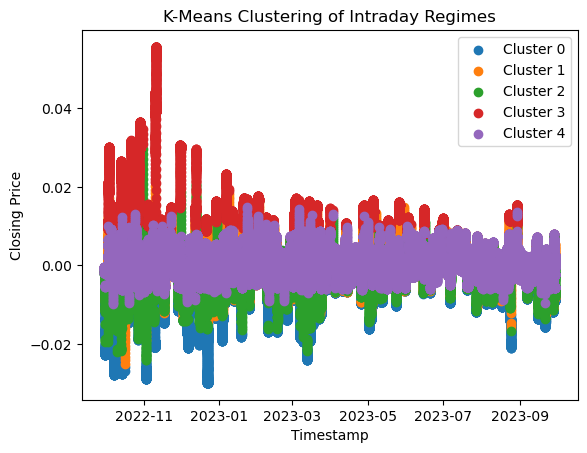

In [47]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# SMA of returns each period by first close by each day's first close
intraday_data['Ima_5'] = intraday_data['intraday_return'].rolling(window=5).mean()  # Simple Moving Average
intraday_data['Ima_30'] = intraday_data['intraday_return'].rolling(window=30).mean()

# Features for clustering
cluster_features = ['intraday_return', 'trend_macd', 'trend_macd_diff', 'trend_macd_signal', 'momentum_rsi','Ima_5','Ima_30','Ima_100']

# Extract the selected features for clustering
cluster_data = intraday_data[cluster_features].dropna()

# Standardize the data
scaler = StandardScaler()
cluster_data_standardized = scaler.fit_transform(cluster_data)
# cluster_data_standardized_df = pd.DataFrame(cluster_data_standardized, columns=cluster_features)

# Apply K-Means clustering
n_clusters = 5  # Adjust the number of clusters as needed
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_data['Cluster'] = kmeans.fit_predict(cluster_data_standardized)

# Merge cluster_data with intraday_data on timestamp
cluster_data = pd.merge(cluster_data, intraday_data[['close']], how='left', left_index=True, right_index=True).dropna()
cluster_data = cluster_data.dropna()

# Visualize the clusters
for cluster_id in range(n_clusters):
    cluster_subset = cluster_data[cluster_data['Cluster'] == cluster_id]
    plt.scatter(cluster_subset.index, cluster_subset['Ima_30'], label=f'Cluster {cluster_id}')

plt.title('K-Means Clustering of Intraday Regimes')
plt.xlabel('Timestamp')
plt.ylabel('Closing Price')
plt.legend()
plt.show()

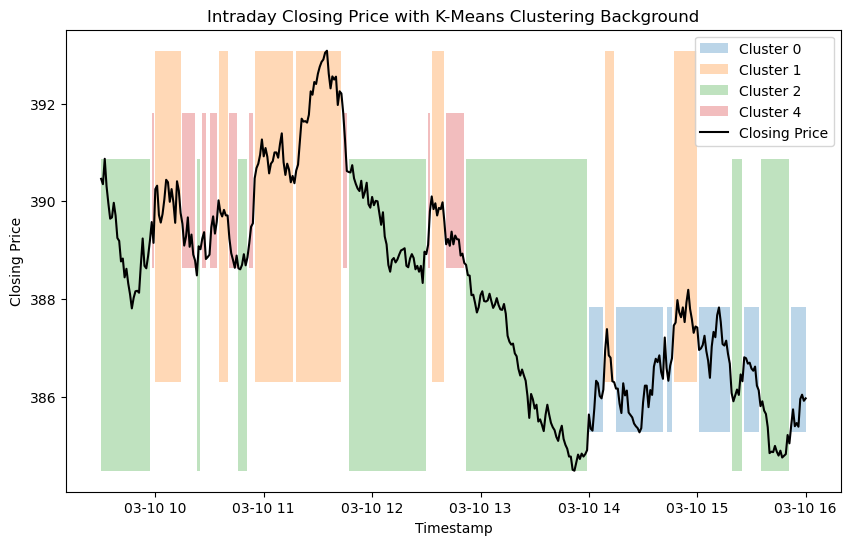

In [33]:
cluster_d = cluster_data['2023-03-10 09:30:00':'2023-03-10 16:00:00']

# Plot the closing price
fig, ax = plt.subplots(figsize=(10, 6))

# Group by the 'Cluster' column and iterate over groups
for cluster_id, cluster_subset in cluster_d.groupby('Cluster'):
    
    # Create a where condition for each point in cluster_subset
    where_condition = cluster_d['Cluster'] == cluster_id

    # Fix the size of the 'where' condition
    ax.fill_between(cluster_d.index, min(cluster_subset['close']), max(cluster_subset['close']),
                    where=where_condition, alpha=0.3, label=f'Cluster {cluster_id}')

# Plot the closing price line
ax.plot(cluster_d.index, cluster_d['close'], label='Closing Price', color='black')

ax.set_title('Intraday Closing Price with K-Means Clustering Background')
ax.set_xlabel('Timestamp')
ax.set_ylabel('Closing Price')
ax.legend()
plt.show()

### Plot Clusters by All Cluster_Feature Pairs

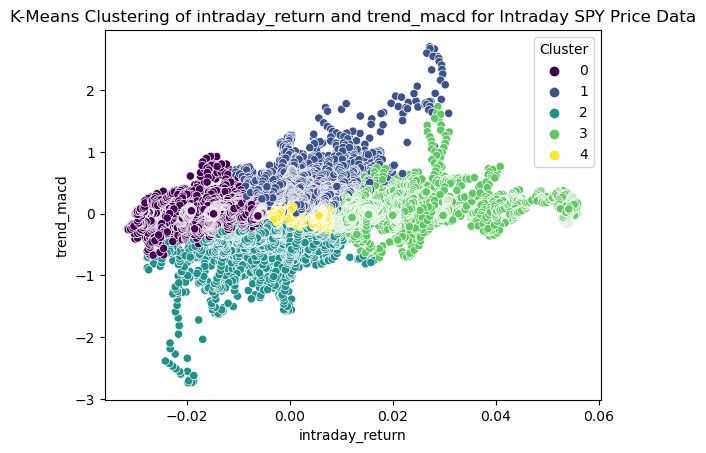

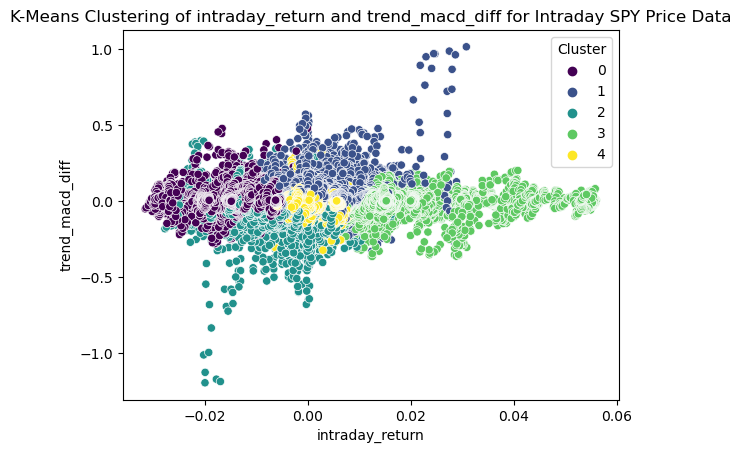

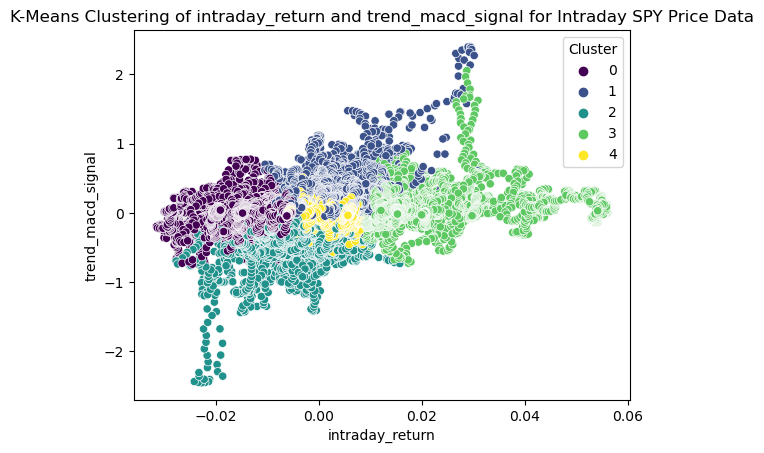

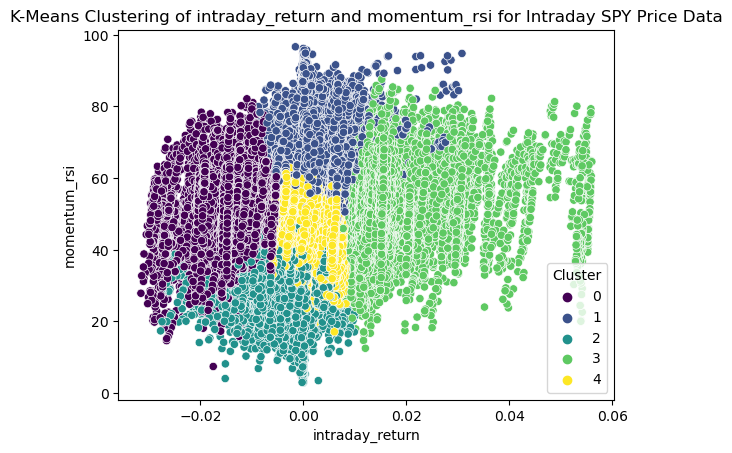

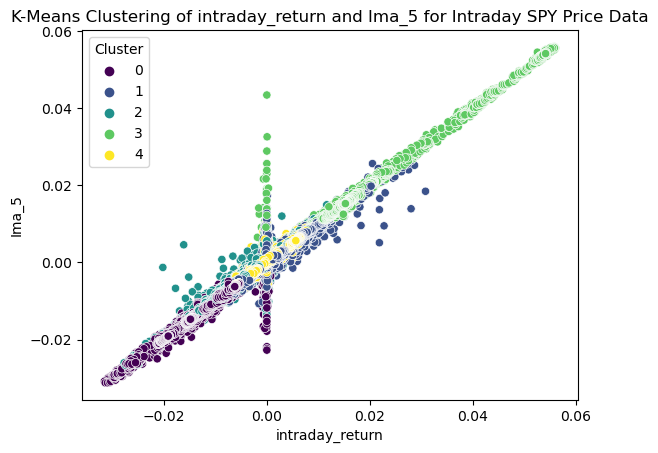

...

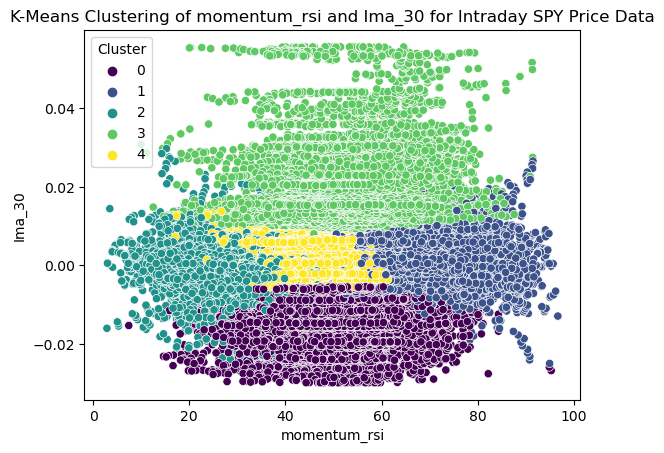

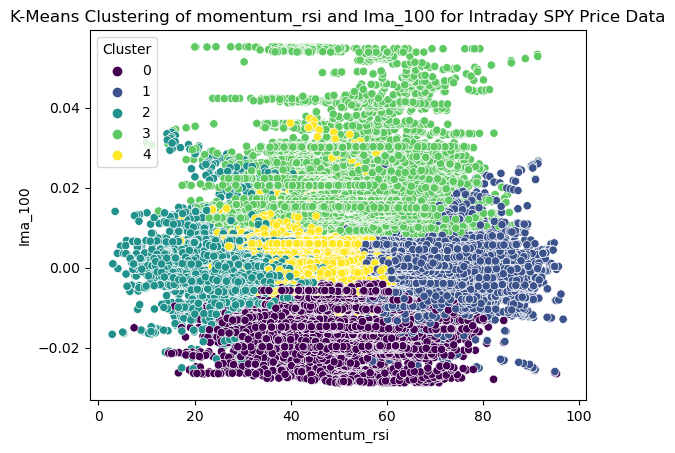

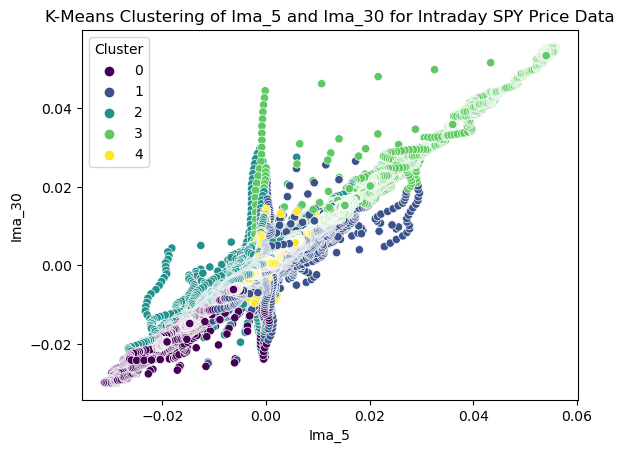

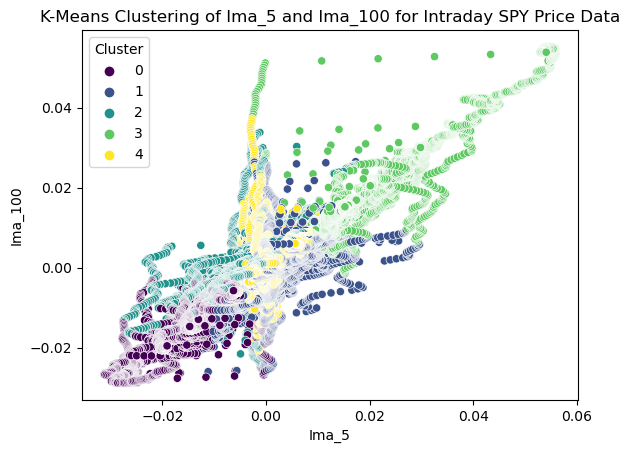

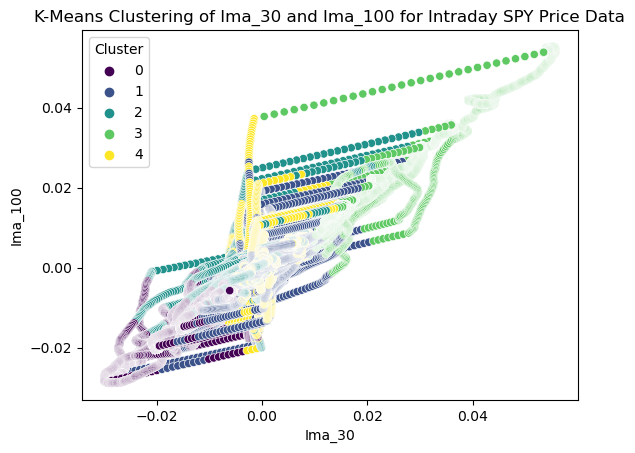

In [156]:
# Create scatter plots for different feature pairs
for i in range(len(cluster_features) - 1):
    for j in range(i + 1, len(cluster_features)):
        feature_x = cluster_features[i]
        feature_y = cluster_features[j]
        
        # Visualize the clusters for the selected feature pair
        sns.scatterplot(x=feature_x, y=feature_y, hue='Cluster', data=cluster_data, palette='viridis')
        plt.title(f'K-Means Clustering of {feature_x} and {feature_y} for Intraday SPY Price Data')
        plt.show()

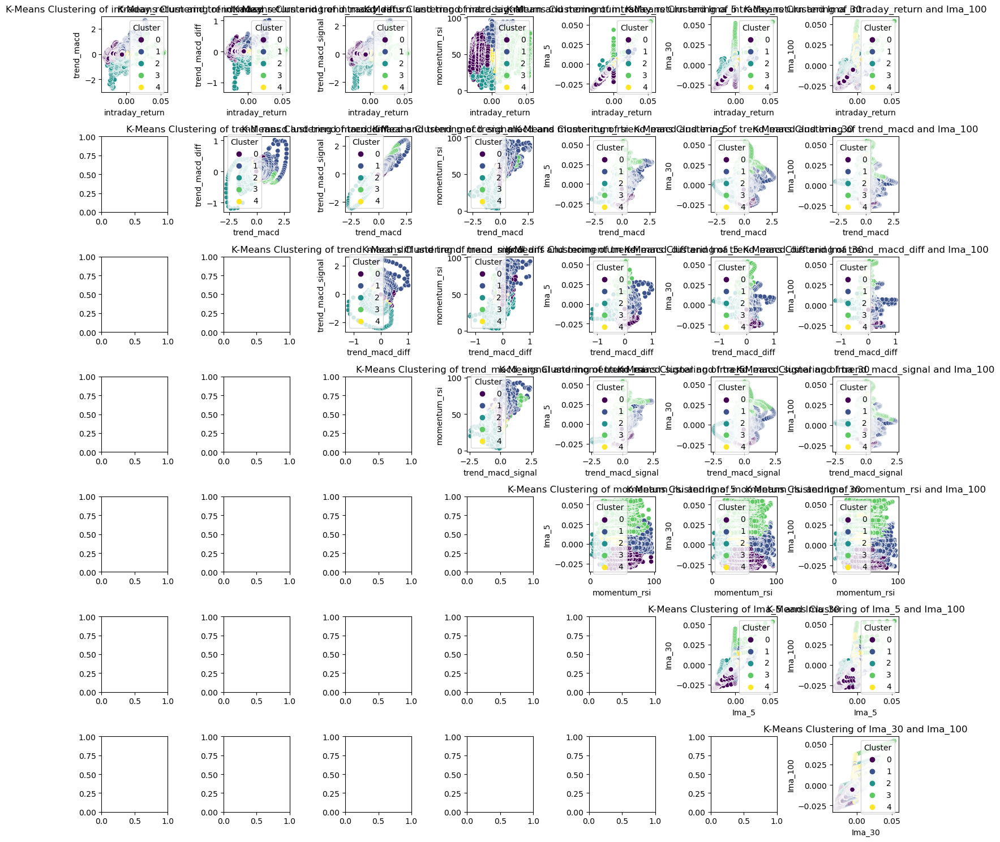

In [157]:
# Create a grid of scatter plots for different feature pairs
fig, axes = plt.subplots(len(cluster_features)-1, len(cluster_features)-1, figsize=(15, 15))

for i in range(len(cluster_features) - 1):
    for j in range(i + 1, len(cluster_features)):
        feature_x = cluster_features[i]
        feature_y = cluster_features[j]
        
        # Visualize the clusters for the selected feature pair
        sns.scatterplot(x=feature_x, y=feature_y, hue='Cluster', data=cluster_data, palette='viridis', ax=axes[i, j-1])
        axes[i, j-1].set_title(f'K-Means Clustering of {feature_x} and {feature_y}')
        axes[i, j-1].set_xlabel(feature_x)
        axes[i, j-1].set_ylabel(feature_y)

# Adjust layout
plt.tight_layout()
plt.show()

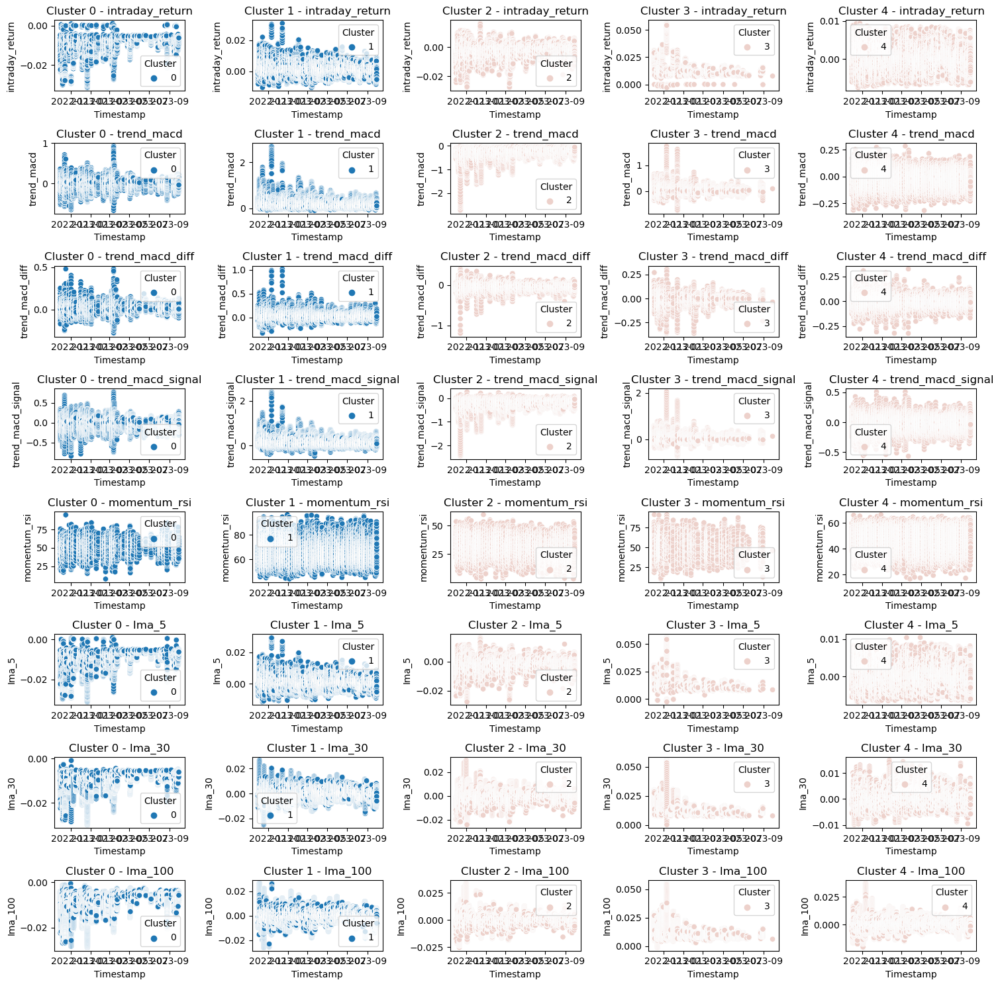

In [151]:

# Create subplots for each feature
num_features = len(cluster_features)
num_clusters = n_clusters
fig, axes = plt.subplots(num_features, num_clusters, figsize=(15, 15))

# Plot each feature for each cluster
for i, feature in enumerate(cluster_features):
    for j in range(num_clusters):
        # Subset data for the specific cluster
        cluster_subset = cluster_data[cluster_data['Cluster'] == j]
        
        # Plot the scatter plot for the specific cluster
        sns.scatterplot(x=cluster_subset.index, y=feature, hue='Cluster', data=cluster_subset, ax=axes[i, j])
        axes[i, j].set_title(f'Cluster {j} - {feature}')
        axes[i, j].set_xlabel('Timestamp')
        axes[i, j].set_ylabel(feature)

plt.tight_layout()
plt.show()

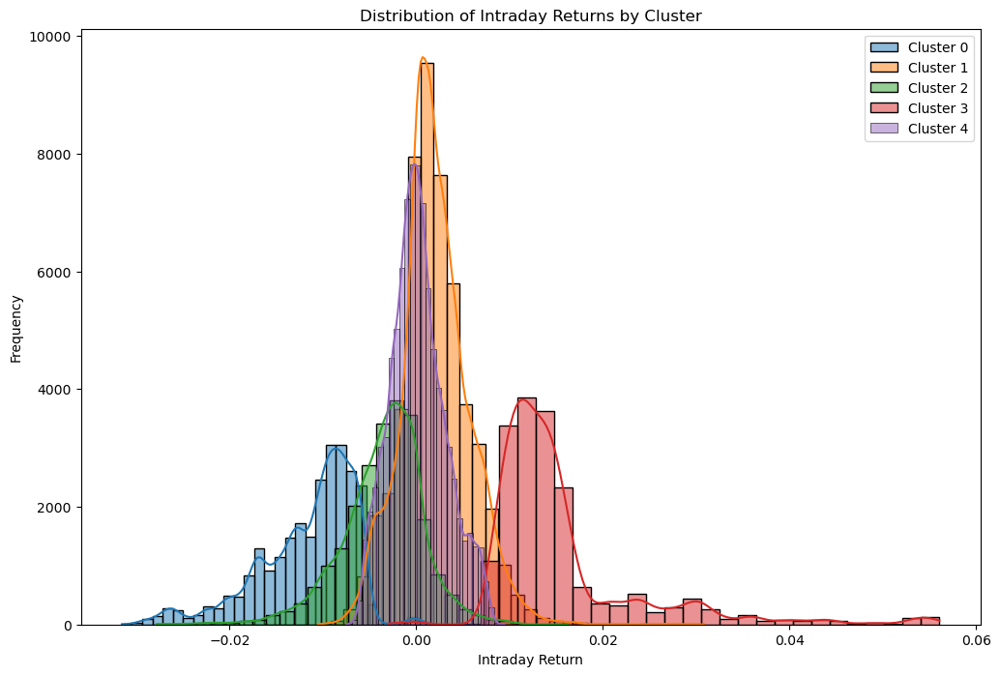

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the distribution of intraday_return for each cluster
plt.figure(figsize=(12, 8))
for cluster_id in range(n_clusters):
    cluster_subset = cluster_data[cluster_data['Cluster'] == cluster_id]
    sns.histplot(cluster_subset['intraday_return'], kde=True, label=f'Cluster {cluster_id}', bins=30)

plt.title('Distribution of Intraday Returns by Cluster')
plt.xlabel('Intraday Return')
plt.ylabel('Frequency')
plt.legend()
plt.show()

In [10]:
import numpy as np

# Group data by cluster
cluster_groups = cluster_data.groupby('Cluster')

# Print summary statistics for each cluster
for cluster_id, cluster_subset in cluster_groups:
    print(f"\nCluster {cluster_id} Statistics:")
    print("Size:", len(cluster_subset))
    print("Mean of Intraday Returns:", np.mean(cluster_subset['intraday_return']))
    print("Standard Deviation of Intraday Returns:", np.std(cluster_subset['intraday_return']))
    print("Skewness of Intraday Returns:", cluster_subset['intraday_return'].skew())
    print("Kurtosis of Intraday Returns:", cluster_subset['intraday_return'].kurtosis())


Cluster 0 Statistics:
Size: 25575
Mean of Intraday Returns: -0.011617781875015823
Standard Deviation of Intraday Returns: 0.0051737665743122755
Skewness of Intraday Returns: -1.0465229129679658
Kurtosis of Intraday Returns: 0.9874905596893062

Cluster 1 Statistics:
Size: 50670
Mean of Intraday Returns: 0.0020575162685188245
Standard Deviation of Intraday Returns: 0.0036798503738370105
Skewness of Intraday Returns: 0.5452922722651584
Kurtosis of Intraday Returns: 2.006036047978865

Cluster 2 Statistics:
Size: 23171
Mean of Intraday Returns: -0.003538647470264419
Standard Deviation of Intraday Returns: 0.004420155627481013
Skewness of Intraday Returns: -0.6309473512543654
Kurtosis of Intraday Returns: 2.062693820613549

Cluster 3 Statistics:
Size: 18279
Mean of Intraday Returns: 0.015551488045827596
Standard Deviation of Intraday Returns: 0.008286077129569906
Skewness of Intraday Returns: 2.4092105116139457
Kurtosis of Intraday Returns: 6.824688064781673

Cluster 4 Statistics:
Size: 900

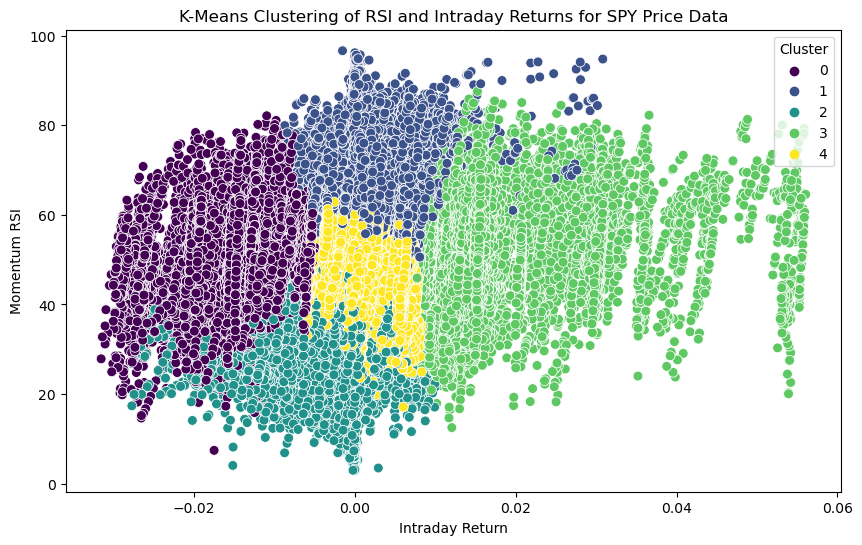

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualize the clusters for 'intraday_return' and 'momentum_rsi'
plt.figure(figsize=(10, 6))
sns.scatterplot(x='intraday_return', y='momentum_rsi', hue='Cluster', data=cluster_data, palette='viridis', s=50)
plt.title('K-Means Clustering of RSI and Intraday Returns for SPY Price Data')
plt.xlabel('Intraday Return')
plt.ylabel('Momentum RSI')
plt.legend(title='Cluster', loc='upper right')
plt.show()

In [ ]:
cluster_data['2022-10-20 010:00:00':'2022-10-21 04:00:00']

### K-Means Cluster Means and Statistics

In [130]:
cluster_means = cluster_data.groupby('Cluster')[cluster_features].mean()
print(cluster_means)

         intraday_return  trend_macd  trend_macd_diff  trend_macd_signal  \
Cluster                                                                    
0              -0.011618   -0.012399         0.009362          -0.021761   
1               0.002058    0.157767         0.024144           0.133623   
2              -0.003539   -0.266234        -0.036878          -0.229355   
3               0.015551    0.041375        -0.006324           0.047698   
4               0.000199   -0.020318        -0.005468          -0.014850   

         momentum_rsi     Ima_5    Ima_30   Ima_100  
Cluster                                              
0           49.954490 -0.011663 -0.011743 -0.011186  
1           63.900761  0.001908  0.001098  0.000467  
2           32.621451 -0.003323 -0.001941 -0.000831  
3           52.240869  0.015580  0.015509  0.014685  
4           47.215290  0.000235  0.000373  0.000453  


In [158]:
from sklearn.metrics import silhouette_score

silhouette_avg = silhouette_score(cluster_data_standardized, kmeans.labels_)
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.2485336409609462


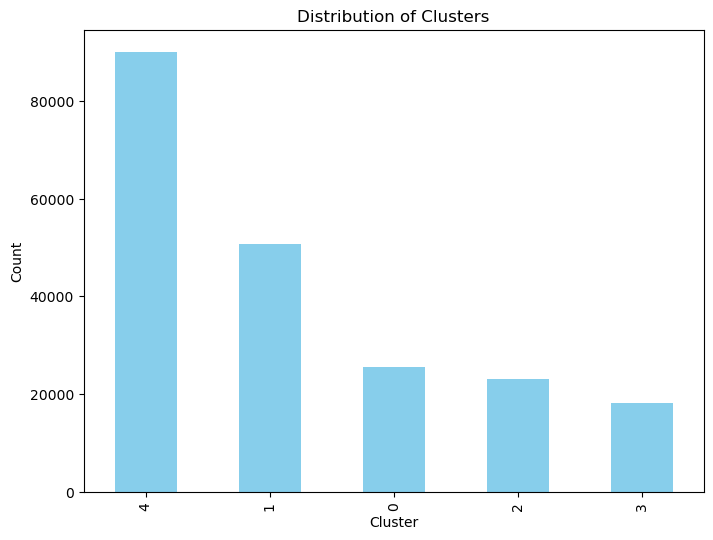

           count      mean       std       min       25%       50%       75%  \
Cluster                                                                        
0        25575.0 -0.011618  0.005174 -0.031550 -0.014444 -0.010229 -0.007859   
1        50670.0  0.002058  0.003680 -0.010546 -0.000101  0.001699  0.004161   
2        23171.0 -0.003539  0.004420 -0.027835 -0.005894 -0.003048 -0.000751   
3        18279.0  0.015551  0.008286 -0.002942  0.010834  0.013168  0.015935   
4        90030.0  0.000199  0.002931 -0.007477 -0.001779  0.000000  0.002000   

              max  
Cluster            
0        0.001207  
1        0.030827  
2        0.016241  
3        0.056056  
4        0.009434  


In [131]:
# Assuming 'Cluster' column is present in intraday_data
cluster_counts = cluster_data['Cluster'].value_counts()

# Plot the distribution of clusters
plt.figure(figsize=(8, 6))
cluster_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Clusters')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.show()

# Explore descriptive statistics for each cluster
cluster_statistics = cluster_data.groupby('Cluster')['intraday_return'].describe()

# Print descriptive statistics
print(cluster_statistics)

## DBSCAN (Density-Based Spatial Clustering of Applications with Noise)

Standardized Features, No PCA

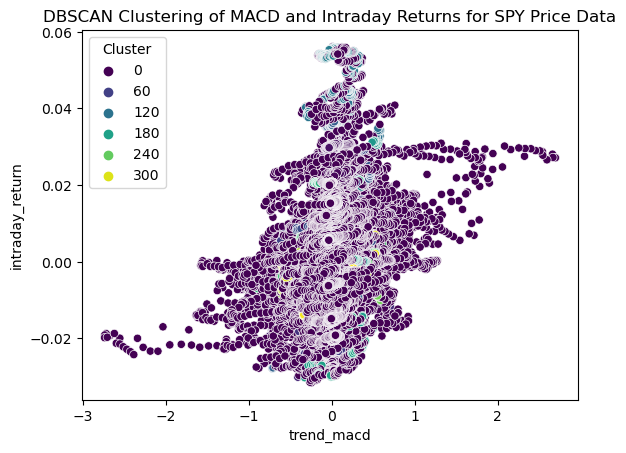

In [190]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

additional_features = ['rsi' ] #, 'atr', 'macd_histogram', 'upper_band', 'lower_band']

# Combine all features
all_features = cluster_features + additional_features

# Extract the selected features for clustering
cluster_data_dbscan = intraday_data[all_features].dropna()

# Standardize the data
scaler_dbscan = StandardScaler()
cluster_data_dbscan_standardized = scaler_dbscan.fit_transform(cluster_data_dbscan)

# Apply DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)  # Adjust parameters as needed
cluster_data_dbscan['Cluster'] = dbscan.fit_predict(cluster_data_dbscan_standardized)

# Visualize the clusters
sns.scatterplot(x='trend_macd', y='intraday_return', hue='Cluster', data=cluster_data_dbscan, palette='viridis')
plt.title('DBSCAN Clustering of MACD and Intraday Returns for SPY Price Data')
plt.show()

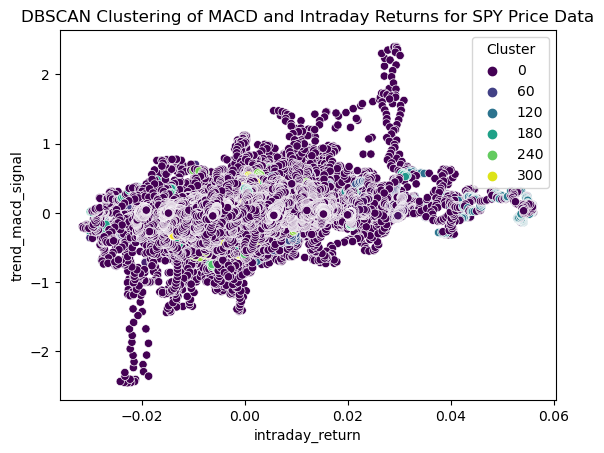

In [191]:
# Visualize the clusters
sns.scatterplot(x='intraday_return', y='trend_macd_signal', hue='Cluster', data=cluster_data_dbscan, palette='viridis')
plt.title('DBSCAN Clustering of MACD and Intraday Returns for SPY Price Data')
plt.show()

## DBSCAN (Density-Based Spatial Clustering of Applications with Noise) with PCA

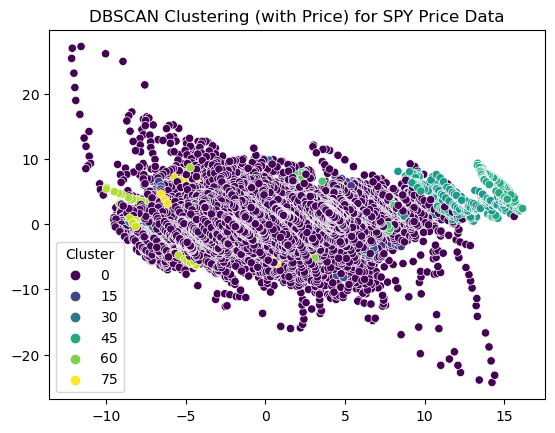

In [189]:
# Assuming you have applied PCA for dimensionality reduction
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

additional_features = ['rsi', 'macd_histogram'] #, 'upper_band', 'lower_band']
# Combine all features
all_features = cluster_features + additional_features + ['intraday_return']

# Extract the selected features for clustering
cluster_data_dbscan = intraday_data[all_features].dropna()

# Standardize the data
scaler_dbscan = StandardScaler()
cluster_data_dbscan_standardized = scaler_dbscan.fit_transform(cluster_data_dbscan)

# Apply DBSCAN clustering with adjusted eps
dbscan = DBSCAN(eps=1.0, min_samples=5)  # Adjust eps as needed
cluster_data_dbscan['Cluster'] = dbscan.fit_predict(cluster_data_dbscan_standardized)

# Use PCA for dimensionality reduction (assuming more than two features)
pca = PCA(n_components=2)
cluster_data_dbscan_pca = pca.fit_transform(cluster_data_dbscan_standardized)

# Visualize the clusters after PCA
sns.scatterplot(x=cluster_data_dbscan_pca[:, 0], y=cluster_data_dbscan_pca[:, 1],
                hue='Cluster', data=cluster_data_dbscan, palette='viridis')
plt.title('DBSCAN Clustering (with Price) for SPY Price Data')
plt.show()

## Consensus Clustering

In [ ]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import squareform
import seaborn as sns
import matplotlib.pyplot as plt

def consensus_clustering(data, n_clusters, n_iterations):
    consensus_matrix = np.zeros((len(data), len(data)))

    for _ in range(n_iterations):
        # Create a subsample of the data
        indices = np.random.choice(len(data), size=len(data), replace=True)
        subsample = data.iloc[indices]

        # Standardize the subsample
        scaler = StandardScaler()
        subsample_standardized = scaler.fit_transform(subsample)

        # Apply K-Means clustering
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        labels = kmeans.fit_predict(subsample_standardized)

        # Update consensus matrix
        consensus_matrix += np.equal.outer(labels, labels)

    # Normalize consensus matrix
    consensus_matrix /= n_iterations

    return consensus_matrix

cluster_features = ['intraday_return', 'trend_macd', 'trend_macd_diff', 'trend_macd_signal', 'momentum_rsi']
cluster_data = intraday_data[cluster_features].dropna()

# Choose the number of clusters and iterations
n_clusters = 5
n_iterations = 20

# Create consensus matrix
consensus_matrix = consensus_clustering(cluster_data, n_clusters, n_iterations)

# Plot the consensus matrix
sns.heatmap(consensus_matrix, cmap='coolwarm', square=True, cbar=True, xticklabels=False, yticklabels=False)
plt.title('Consensus Matrix')
plt.show()


/Users/briankregel/opt/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


## **UNFINISHED CUSUM (Cumulative Sum) algorithm for change point detection

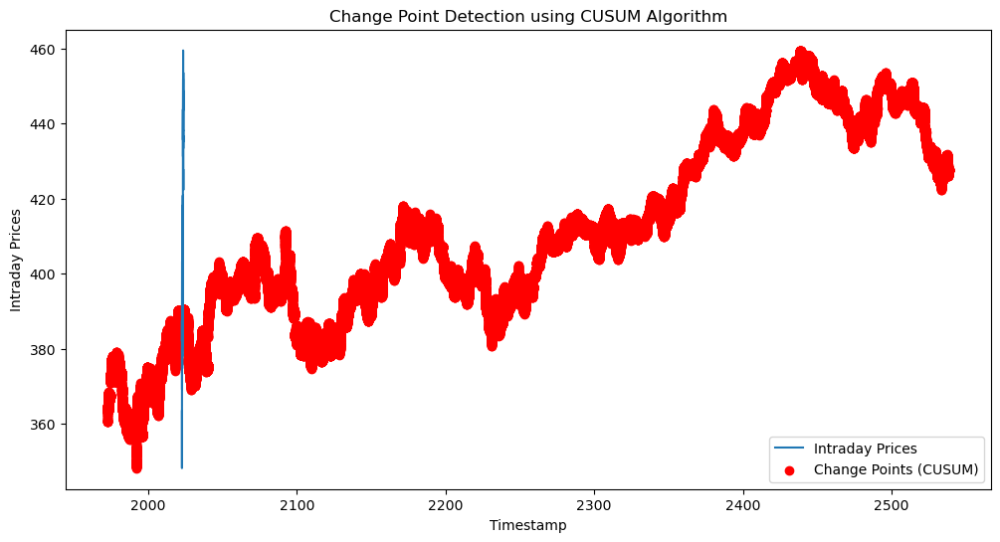

In [280]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def cusum_algorithm(data, threshold=1.5):
    """
    Apply the CUSUM algorithm for change point detection.

    Parameters:
    - data: A pandas Series representing the time series data.
    - threshold: The threshold for detecting a change. Adjust as needed.

    Returns:
    - An array indicating the detected change points.
    """
    mean = data.mean()
    cusum = np.zeros(len(data))
    exceedances = []

    for i in range(1, len(data)):
        cusum[i] = max(0, cusum[i-1] + (data[i] - mean))
        if cusum[i] > threshold:
            exceedances.append(i)

    return np.array(exceedances)

change_points_cusum = cusum_algorithm(intraday_data['intraday_return'])

# Plotting the results
plt.figure(figsize=(12, 6))
plt.plot(intraday_data['close'], label='Intraday Prices')
plt.scatter(change_points_cusum, intraday_data['close'].iloc[change_points_cusum], color='red', label='Change Points (CUSUM)')
plt.title('Change Point Detection using CUSUM Algorithm')
plt.xlabel('Timestamp')
plt.ylabel('Intraday Prices')
plt.legend()
plt.show()

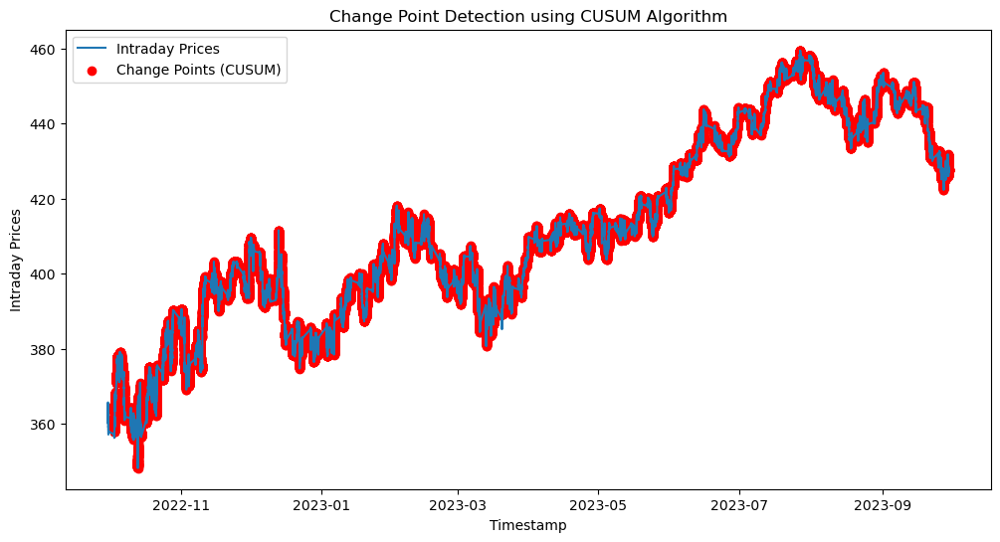

In [267]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def cusum_algorithm(data, threshold=.10):
    """
    Apply the CUSUM algorithm for change point detection.

    Parameters:
    - data: A pandas Series representing the time series data.
    - threshold: The threshold for detecting a change. Adjust as needed.

    Returns:
    - A DataFrame with timestamps and a column indicating the detected change points.
    """
    mean = data.mean()
    cusum = np.zeros(len(data))
    exceedances = []

    for i in range(1, len(data)):
        cusum[i] = max(0, cusum[i-1] + (data[i] - mean))
        if cusum[i] > threshold:
            exceedances.append(i)

    # Create a DataFrame with timestamps and detected change points
    change_points_df = pd.DataFrame({'Timestamp': data.index, 'ChangePoint_CUSUM': 0})
    change_points_df.loc[exceedances, 'ChangePoint_CUSUM'] = 1

    return change_points_df


# Example Usage:
# Assuming 'intraday_data' is your DataFrame with a column 'close' representing intraday prices
change_points_cusum_df = cusum_algorithm(intraday_data['intraday_return'])

# Plotting the results
plt.figure(figsize=(12, 6))
plt.plot(intraday_data['close'], label='Intraday Prices')
change_points = change_points_cusum_df[change_points_cusum_df['ChangePoint_CUSUM'] == 1]
change_points = change_points.set_index('Timestamp')  # Set 'Timestamp' as the index
plt.scatter(change_points.index, intraday_data['close'].loc[change_points.index],
            color='red', label='Change Points (CUSUM)')
plt.title('Change Point Detection using CUSUM Algorithm')
plt.xlabel('Timestamp')
plt.ylabel('Intraday Prices')
plt.legend()
plt.show()


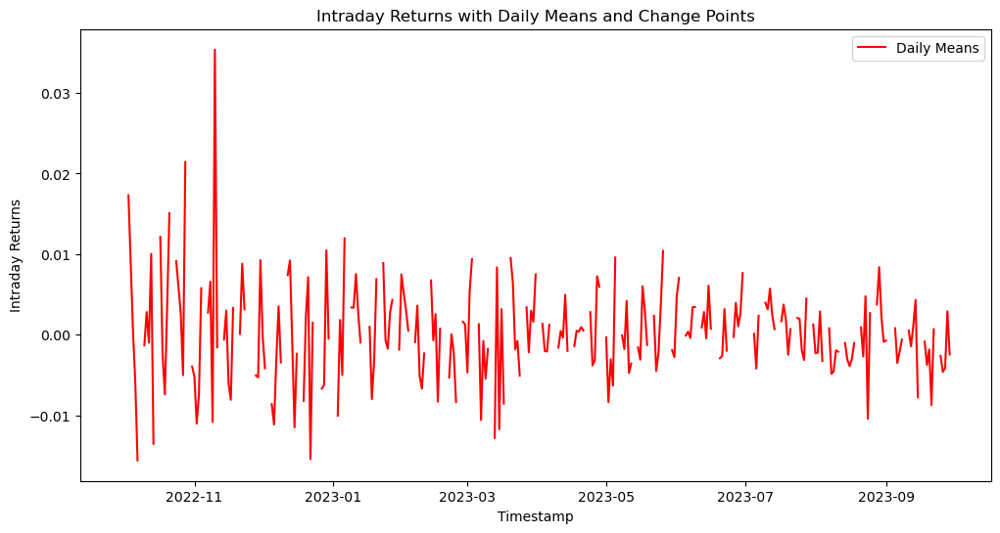

In [274]:
import matplotlib.pyplot as plt

# Assuming 'intraday_data' is your DataFrame with 'intraday_return' column
# Assuming 'change_points_cusum_df' is the DataFrame containing CUSUM change points

# Calculate daily mean of intraday returns
daily_means = intraday_data.resample('D').mean()

# Plot intraday returns
plt.figure(figsize=(12, 6))
# plt.plot(intraday_data.index, intraday_data['intraday_return'], label='Intraday Returns')

# # Plot daily means
plt.plot(daily_means.index, daily_means['intraday_return'], color='red', label='Daily Means')

# # Highlight change points
# change_points = change_points_cusum_df[change_points_cusum_df['ChangePoint_CUSUM'] == 1]
# plt.scatter(change_points.index, intraday_data['intraday_return'].loc[change_points.index],
#             color='green', label='Change Points (CUSUM)')

plt.title('Intraday Returns with Daily Means and Change Points')
plt.xlabel('Timestamp')
plt.ylabel('Intraday Returns')
plt.legend()
plt.show()


timestamp
2022-09-30   -0.013819
2022-10-01         NaN
2022-10-02         NaN
2022-10-03    0.017298
2022-10-04    0.008803
                ...   
2023-09-25   -0.002627
2023-09-26   -0.004622
2023-09-27   -0.004118
2023-09-28    0.002908
2023-09-29   -0.002435
Freq: D, Name: intraday_return, Length: 365, dtype: float64


In [263]:
intraday_data['close'].mean()

410.73579655869963

In [ ]:
# Specify the date range
date_range = ('2022-10-26 09:30:00', '2022-10-26 16:00:00')

# Plotting the results for the specified date range
plt.figure(figsize=(12, 6))
plt.plot(intraday_data['close'].loc[date_range[0]:date_range[1]], label='Intraday Prices')
change_points = change_points_cusum_df[(change_points_cusum_df['ChangePoint_CUSUM'] == 1) & 
                                       (change_points_cusum_df['Timestamp'] >= date_range[0]) &
                                       (change_points_cusum_df['Timestamp'] <= date_range[1])]
change_points = change_points.set_index('Timestamp')  # Set 'Timestamp' as the index
plt.scatter(change_points.index, intraday_data['close'].loc[change_points.index],
            color='red', label='Change Points (CUSUM)')
plt.title('Change Point Detection using CUSUM Algorithm')
plt.xlabel('Timestamp')
plt.ylabel('Intraday Prices')
plt.legend()
plt.show()

### Summary Statistics and Distribution

In [ ]:
# Assuming 'intraday_return' is the column in your dataframe
summary_stats = intraday_data['intraday_return'].describe()

# Print the summary statistics
print(summary_stats)
# Assuming 'intraday_return' is the column in your dataframe
plt.figure(figsize=(10, 6))
sns.histplot(data=intraday_data, x='intraday_return', bins=50, kde=True, color='blue')
plt.title('Distribution of Intraday Returns')
plt.xlabel('Intraday Return')
plt.ylabel('Frequency')
plt.show()

In [281]:
sum_of_zeros = (change_points['ChangePoint_CUSUM'] == 0).sum()

print(f"Sum of values equal to 0 in 'ChangePoint_CUSUM': {sum_of_zeros}")


Sum of values equal to 0 in 'ChangePoint_CUSUM': 0


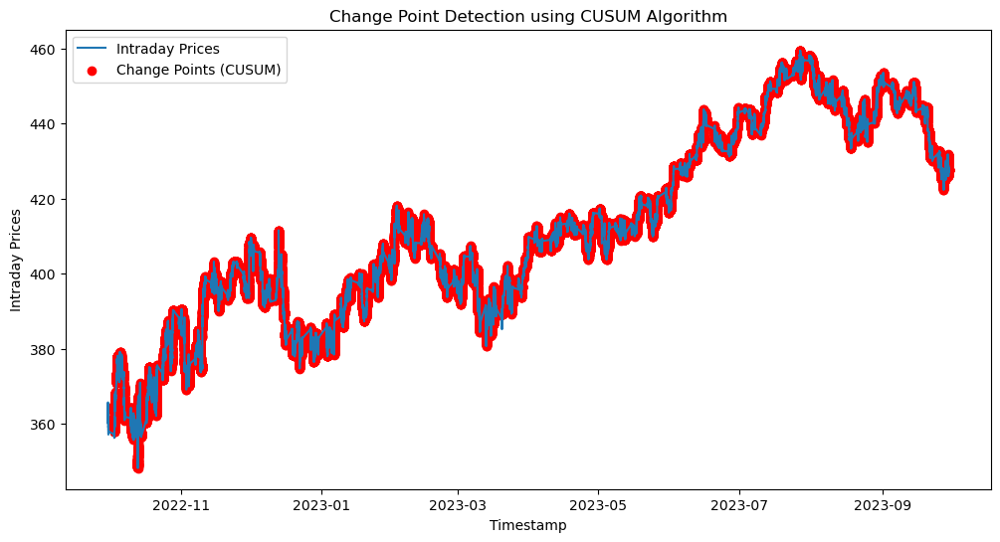

In [283]:
# Plotting the results
plt.figure(figsize=(12, 6))
plt.plot(intraday_data['close'], label='Intraday Prices')
change_points = change_points_cusum_df[change_points_cusum_df['ChangePoint_CUSUM'] == 1]
change_points = change_points.set_index('Timestamp')  # Set 'Timestamp' as the index
plt.scatter(change_points.index, intraday_data['close'].loc[change_points.index],
            color='red', label='Change Points (CUSUM)')
plt.title('Change Point Detection using CUSUM Algorithm')
plt.xlabel('Timestamp')
plt.ylabel('Intraday Prices')
plt.legend()
plt.show()

In [217]:
import numpy as np

def detect_cusum(data, threshold=1, drift=0):
    """
    Applies the CUSUM algorithm to detect changes in a dataset.

    Parameters:
    - data: The input data (e.g., intraday returns).
    - threshold: The threshold for detecting changes.
    - drift: The drift parameter to control the reset speed of the cumulative sum.

    Returns:
    - change_points: A list of indices where changes are detected.
    """
    change_points = []
    cusum = 0

    for i in range(1, len(data)):
        x = data[i]
        cusum = max(0, cusum + x - threshold - drift)
        
        if cusum > 0:
            change_points.append(i)

    return change_points

In [ ]:
returns = intraday_data['intraday_return'].values  # Replace with the appropriate column
change_points = detect_cusum(returns, threshold=0.5, drift=0.1)

In [193]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def dynamic_cusum_algorithm(data, threshold=1, window=20):
    """
    Apply a dynamic CUSUM algorithm with a moving average for change point detection.

    Parameters:
    - data: A pandas Series representing the time series data.
    - threshold: The threshold for detecting a change. Adjust as needed.
    - window: The size of the moving average window.

    Returns:
    - A DataFrame with timestamps and a column indicating the detected change points.
    """
    # Calculate the moving average
    moving_average = data.rolling(window=5).mean()
    moving_average = data.rolling(window=5).mean()

    cusum = np.zeros(len(data))
    exceedances = []

    for i in range(1, len(data)):
        # Use the moving average as the dynamic mean
        mean = moving_average.iloc[i]

        cusum[i] = max(0, cusum[i-1] + (data[i] - mean))
        if cusum[i] > threshold:
            exceedances.append(i)

    # Create a DataFrame with timestamps and detected change points
    change_points_df = pd.DataFrame({'Timestamp': data.index, 'ChangePoint_CUSUM': 0})
    change_points_df.loc[exceedances, 'ChangePoint_CUSUM'] = 1

    return change_points_df

# Example Usage:
# Assuming 'intraday_data' is your DataFrame with a column 'close' representing intraday prices
change_points_dynamic_cusum_df = dynamic_cusum_algorithm(intraday_data['close'])

# Plotting the results
plt.figure(figsize=(12, 6))
plt.plot(intraday_data['close'], label='Intraday Prices')
change_points = change_points_dynamic_cusum_df[change_points_dynamic_cusum_df['ChangePoint_CUSUM'] == 1]
change_points = change_points.set_index('Timestamp')  # Set 'Timestamp' as the index
plt.scatter(change_points.index, intraday_data['close'].loc[change_points.index],
            color='red', label='Change Points (Dynamic CUSUM)')
plt.title('Change Point Detection using Dynamic CUSUM Algorithm')
plt.xlabel('Timestamp')
plt.ylabel('Intraday Prices')
plt.legend()
plt.show()

array([ 44621,  44622,  44623, ..., 207622, 207623, 207624])

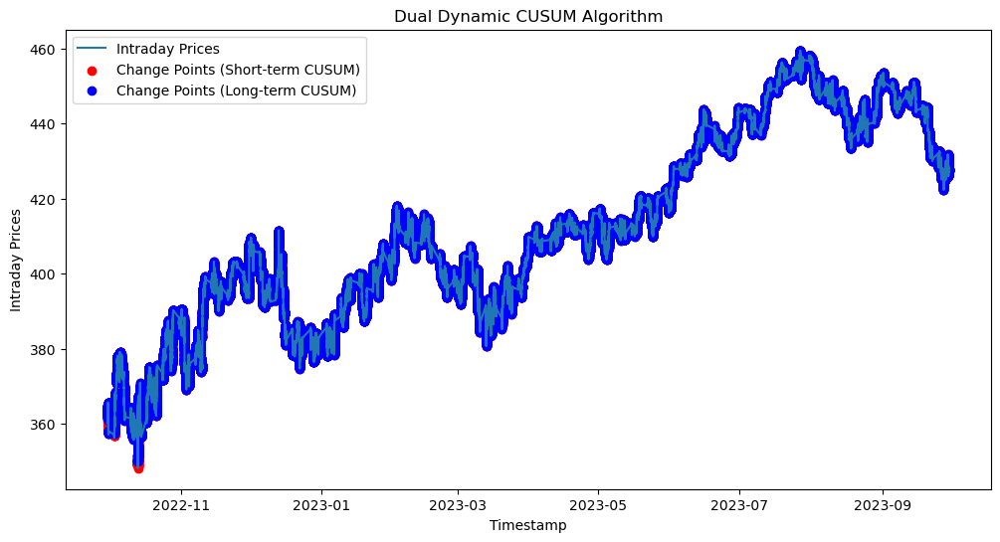

In [284]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def dual_dynamic_cusum_algorithm(data, threshold_short=1, threshold_long=2, window_short=10, window_long=50):
    """
    Apply dual dynamic CUSUM algorithms with different moving averages for change point detection.

    Parameters:
    - data: A pandas Series representing the time series data.
    - threshold_short: The threshold for detecting a change in the short-term CUSUM.
    - threshold_long: The threshold for detecting a change in the long-term CUSUM.
    - window_short: The size of the short-term moving average window.
    - window_long: The size of the long-term moving average window.

    Returns:
    - Two DataFrames with timestamps and columns indicating the detected change points for short and long-term CUSUM.
    """
    # Calculate short-term and long-term moving averages
    moving_average_short = data.rolling(window=window_short).mean()
    moving_average_long = data.rolling(window=window_long).mean()

    cusum_short = np.zeros(len(data))
    cusum_long = np.zeros(len(data))
    exceedances_short = []
    exceedances_long = []

    for i in range(1, len(data)):
        # Use the moving averages as dynamic means
        mean_short = moving_average_short.iloc[i]
        mean_long = moving_average_long.iloc[i]

        # Update short-term CUSUM
        cusum_short[i] = max(0, cusum_short[i-1] + (data[i] - mean_short))
        if cusum_short[i] > threshold_short:
            exceedances_short.append(i)

        # Update long-term CUSUM
        cusum_long[i] = max(0, cusum_long[i-1] + (data[i] - mean_long))
        if cusum_long[i] > threshold_long:
            exceedances_long.append(i)

    # Create DataFrames with timestamps and detected change points
    change_points_short_df = pd.DataFrame({'Timestamp': data.index, 'ChangePoint_CUSUM_Short': 0})
    change_points_short_df.loc[exceedances_short, 'ChangePoint_CUSUM_Short'] = 1

    change_points_long_df = pd.DataFrame({'Timestamp': data.index, 'ChangePoint_CUSUM_Long': 0})
    change_points_long_df.loc[exceedances_long, 'ChangePoint_CUSUM_Long'] = 1

    return change_points_short_df, change_points_long_df

# Example Usage:
# Assuming 'intraday_data' is your DataFrame with a column 'close' representing intraday prices
change_points_short_df, change_points_long_df = dual_dynamic_cusum_algorithm(intraday_data['close'])

# Plotting the results
plt.figure(figsize=(12, 6))
plt.plot(intraday_data['close'], label='Intraday Prices')
change_points_short = change_points_short_df[change_points_short_df['ChangePoint_CUSUM_Short'] == 1]
change_points_long = change_points_long_df[change_points_long_df['ChangePoint_CUSUM_Long'] == 1]
change_points_short = change_points_short.set_index('Timestamp')  # Set 'Timestamp' as the index
change_points_long = change_points_long.set_index('Timestamp')  # Set 'Timestamp' as the index
plt.scatter(change_points_short.index, intraday_data['close'].loc[change_points_short.index],
            color='red', label='Change Points (Short-term CUSUM)')
plt.scatter(change_points_long.index, intraday_data['close'].loc[change_points_long.index],
            color='blue', label='Change Points (Long-term CUSUM)')
plt.title('Dual Dynamic CUSUM Algorithm')
plt.xlabel('Timestamp')
plt.ylabel('Intraday Prices')
plt.legend()
plt.show()


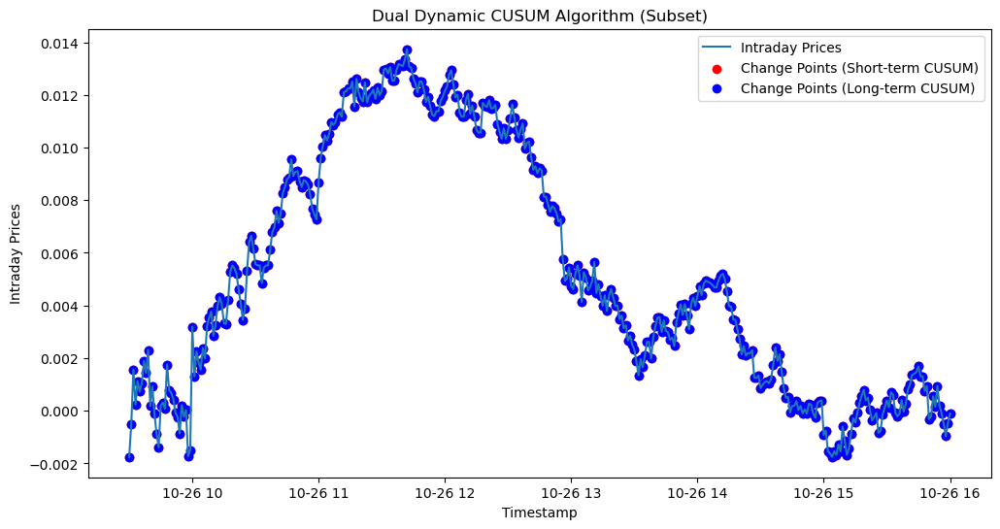

In [289]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def dual_dynamic_cusum_algorithm(data, threshold_short=.01, threshold_long=.01, window_short=10, window_long=50):
    """
    Apply dual dynamic CUSUM algorithms with different moving averages for change point detection.

    Parameters:
    - data: A pandas Series representing the time series data.
    - threshold_short: The threshold for detecting a change in the short-term CUSUM.
    - threshold_long: The threshold for detecting a change in the long-term CUSUM.
    - window_short: The size of the short-term moving average window.
    - window_long: The size of the long-term moving average window.

    Returns:
    - Two DataFrames with timestamps and columns indicating the detected change points for short and long-term CUSUM.
    """
    # Calculate short-term and long-term moving averages
    moving_average_short = data.rolling(window=window_short).mean()
    moving_average_long = data.rolling(window=window_long).mean()

    cusum_short = np.zeros(len(data))
    cusum_long = np.zeros(len(data))
    exceedances_short = []
    exceedances_long = []

    for i in range(1, len(data)):
        # Use the moving averages as dynamic means
        mean_short = moving_average_short.iloc[i]
        mean_long = moving_average_long.iloc[i]

        # Update short-term CUSUM
        cusum_short[i] = max(0, cusum_short[i-1] + (data[i] - mean_short))
        if cusum_short[i] > threshold_short:
            exceedances_short.append(i)

        # Update long-term CUSUM
        cusum_long[i] = max(0, cusum_long[i-1] + (data[i] - mean_long))
        if cusum_long[i] > threshold_long:
            exceedances_long.append(i)

    # Create DataFrames with timestamps and detected change points
    change_points_short_df = pd.DataFrame({'Timestamp': data.index, 'ChangePoint_CUSUM_Short': 0})
    change_points_short_df.loc[exceedances_short, 'ChangePoint_CUSUM_Short'] = 1

    change_points_long_df = pd.DataFrame({'Timestamp': data.index, 'ChangePoint_CUSUM_Long': 0})
    change_points_long_df.loc[exceedances_long, 'ChangePoint_CUSUM_Long'] = 1

    return change_points_short_df, change_points_long_df

# Example Usage:
# Assuming 'intraday_data' is your DataFrame with a column 'close' representing intraday prices
change_points_short_df, change_points_long_df = dual_dynamic_cusum_algorithm(intraday_data['intraday_return'])

# Specify the time range of interest
start_time = '2022-10-26 09:30:00'
end_time = '2022-10-26 16:00:00'

# Filter data for the specified time range
intraday_data_subset = intraday_data[start_time:end_time]
change_points_short_df_subset = change_points_short_df[
    (change_points_short_df['Timestamp'] >= start_time) & (change_points_short_df['Timestamp'] <= end_time)
]
change_points_long_df_subset = change_points_long_df[
    (change_points_long_df['Timestamp'] >= start_time) & (change_points_long_df['Timestamp'] <= end_time)
]

# Plotting the results for the subset
plt.figure(figsize=(12, 6))
plt.plot(intraday_data_subset['intraday_return'], label='Intraday Prices')
change_points_short_subset = change_points_short_df_subset[change_points_short_df_subset['ChangePoint_CUSUM_Short'] == 1]
change_points_long_subset = change_points_long_df_subset[change_points_long_df_subset['ChangePoint_CUSUM_Long'] == 1]
change_points_short_subset = change_points_short_subset.set_index('Timestamp')  # Set 'Timestamp' as the index
change_points_long_subset = change_points_long_subset.set_index('Timestamp')  # Set 'Timestamp' as the index
plt.scatter(change_points_short_subset.index, intraday_data_subset['intraday_return'].loc[change_points_short_subset.index],
            color='red', label='Change Points (Short-term CUSUM)')
plt.scatter(change_points_long_subset.index, intraday_data_subset['intraday_return'].loc[change_points_long_subset.index],
            color='blue', label='Change Points (Long-term CUSUM)')
plt.title('Dual Dynamic CUSUM Algorithm (Subset)')
plt.xlabel('Timestamp')
plt.ylabel('Intraday Prices')
plt.legend()
plt.show()


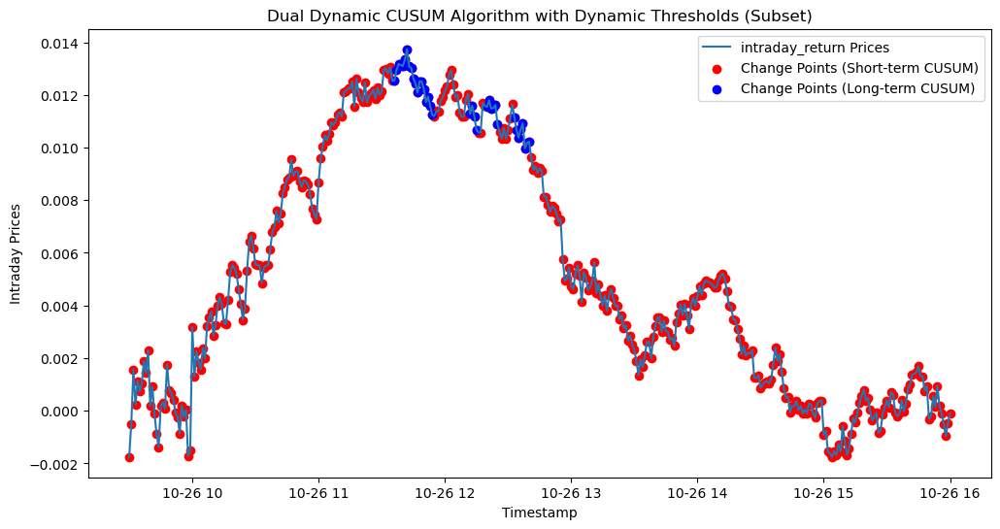

In [318]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def dual_dynamic_cusum_algorithm(data, window_short=5, window_long=30):
    """
    Apply dual dynamic CUSUM algorithms with different moving averages for change point detection.

    Parameters:
    - data: A pandas Series representing the time series data.
    - window_short: The size of the short-term moving average window.
    - window_long: The size of the long-term moving average window.

    Returns:
    - Two DataFrames with timestamps and columns indicating the detected change points for short and long-term CUSUM.
    """
    # Calculate short-term and long-term moving averages
    moving_average_short = data.rolling(window=window_short).mean()
    moving_average_long = data.rolling(window=window_long).mean()

    # Calculate short-term and long-term standard deviations of returns
    std_returns_short = data.rolling(window=window_short).std()
    std_returns_long = data.rolling(window=window_long).std()

    # Use a multiple of standard deviation as a dynamic threshold
    threshold_short = 4 * std_returns_short
    threshold_long = 1000.5 * std_returns_long

    cusum_short = np.zeros(len(data))
    cusum_long = np.zeros(len(data))
    exceedances_short = []
    exceedances_long = []

    for i in range(1, len(data)):
        # Use the moving averages as dynamic means
        mean_short = moving_average_short.iloc[i]
        mean_long = moving_average_long.iloc[i]

        # Update short-term CUSUM
        cusum_short[i] = max(0, cusum_short[i-1] + (data[i] - mean_short))
        if cusum_short[i] > threshold_short.iloc[i]:
            exceedances_short.append(i)

        # Update long-term CUSUM
        cusum_long[i] = max(0, cusum_long[i-1] + (data[i] - mean_long))
        if cusum_long[i] > threshold_long.iloc[i]:
            exceedances_long.append(i)

    # Create DataFrames with timestamps and detected change points
    change_points_short_df = pd.DataFrame({'Timestamp': data.index, 'ChangePoint_CUSUM_Short': 0})
    change_points_short_df.loc[exceedances_short, 'ChangePoint_CUSUM_Short'] = 1

    change_points_long_df = pd.DataFrame({'Timestamp': data.index, 'ChangePoint_CUSUM_Long': 0})
    change_points_long_df.loc[exceedances_long, 'ChangePoint_CUSUM_Long'] = 1

    return change_points_short_df, change_points_long_df

# Example Usage:
# Assuming 'intraday_data' is your DataFrame with a column 'close' representing intraday prices
change_points_short_df, change_points_long_df = dual_dynamic_cusum_algorithm(intraday_data['intraday_return'])

# Specify the time range of interest
start_time = '2022-10-26 09:30:00'
end_time = '2022-10-26 16:00:00'

# Filter data for the specified time range
intraday_data_subset = intraday_data[start_time:end_time]
change_points_short_df_subset = change_points_short_df[
    (change_points_short_df['Timestamp'] >= start_time) & (change_points_short_df['Timestamp'] <= end_time)
]
change_points_long_df_subset = change_points_long_df[
    (change_points_long_df['Timestamp'] >= start_time) & (change_points_long_df['Timestamp'] <= end_time)
]

# Plotting the results for the subset
plt.figure(figsize=(12, 6))
plt.plot(intraday_data_subset['intraday_return'], label='intraday_return Prices')
change_points_short_subset = change_points_short_df_subset[change_points_short_df_subset['ChangePoint_CUSUM_Short'] == 1]
change_points_long_subset = change_points_long_df_subset[change_points_long_df_subset['ChangePoint_CUSUM_Long'] == 1]
change_points_short_subset = change_points_short_subset.set_index('Timestamp')  # Set 'Timestamp' as the index
change_points_long_subset = change_points_long_subset.set_index('Timestamp')  # Set 'Timestamp' as the index
plt.scatter(change_points_short_subset.index, intraday_data_subset['intraday_return'].loc[change_points_short_subset.index],
            color='red', label='Change Points (Short-term CUSUM)')
plt.scatter(change_points_long_subset.index, intraday_data_subset['intraday_return'].loc[change_points_long_subset.index],
            color='blue', label='Change Points (Long-term CUSUM)')
plt.title('Dual Dynamic CUSUM Algorithm with Dynamic Thresholds (Subset)')
plt.xlabel('Timestamp')
plt.ylabel('Intraday Prices')
plt.legend()
plt.show()


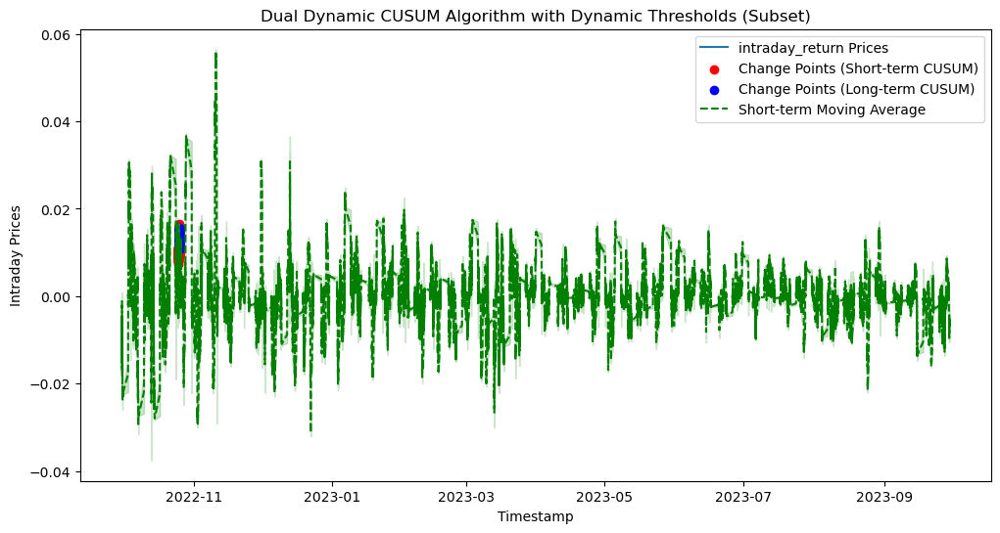

In [339]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def dual_dynamic_cusum_algorithm(data, window_short=5, window_long=30):
    """
    Apply dual dynamic CUSUM algorithms with different moving averages for change point detection.

    Parameters:
    - data: A pandas Series representing the time series data.
    - window_short: The size of the short-term moving average window.
    - window_long: The size of the long-term moving average window.

    Returns:
    - Two DataFrames with timestamps and columns indicating the detected change points for short and long-term CUSUM.
    """
    # Calculate short-term and long-term moving averages
    moving_average_short = data.rolling(window=window_short).mean()
    moving_average_long = data.rolling(window=window_long).mean()

    # Calculate short-term and long-term standard deviations of returns
    std_returns_short = data.rolling(window=window_long).std()
    std_returns_long = data.rolling(window=window_long).std()

    # Use a multiple of standard deviation as a dynamic threshold
    threshold_short = 100 * std_returns_short
    threshold_long = 1000.5 * std_returns_long

    cusum_short = np.zeros(len(data))
    cusum_long = np.zeros(len(data))
    exceedances_short = []
    exceedances_long = []

    for i in range(1, len(data)):
        # Use the moving averages as dynamic means
        mean_short = moving_average_short.iloc[i]
        mean_long = moving_average_long.iloc[i]

        # Update short-term CUSUM
        cusum_short[i] = max(0, cusum_short[i-1] + (data[i] - mean_short))
        if cusum_short[i] > threshold_short.iloc[i]:
            exceedances_short.append(i)

        # Update long-term CUSUM
        cusum_long[i] = max(0, cusum_long[i-1] + (data[i] - mean_long))
        if cusum_long[i] > threshold_long.iloc[i]:
            exceedances_long.append(i)

    # Create DataFrames with timestamps and detected change points
    change_points_short_df = pd.DataFrame({'Timestamp': data.index, 'ChangePoint_CUSUM_Short': 0})
    change_points_short_df.loc[exceedances_short, 'ChangePoint_CUSUM_Short'] = 1

    change_points_long_df = pd.DataFrame({'Timestamp': data.index, 'ChangePoint_CUSUM_Long': 0})
    change_points_long_df.loc[exceedances_long, 'ChangePoint_CUSUM_Long'] = 1

    return change_points_short_df, change_points_long_df, moving_average_short, std_returns_short

# Example Usage:
# Assuming 'intraday_data' is your DataFrame with a column 'intraday_return'
change_points_short_df, change_points_long_df, moving_average_short, std_returns_short = dual_dynamic_cusum_algorithm(intraday_data['intraday_return'])

# Specify the time range of interest
start_time = '2022-10-25 9:30:00'
end_time = '2022-10-25 16:00:00'

# Filter data for the specified time range
intraday_data_subset = intraday_data[start_time:end_time]
change_points_short_df_subset = change_points_short_df[
    (change_points_short_df['Timestamp'] >= start_time) & (change_points_short_df['Timestamp'] <= end_time)
]
change_points_long_df_subset = change_points_long_df[
    (change_points_long_df['Timestamp'] >= start_time) & (change_points_long_df['Timestamp'] <= end_time)
]

# Plotting the results for the subset
plt.figure(figsize=(12, 6))
plt.plot(intraday_data_subset['intraday_return'], label='intraday_return Prices')
change_points_short_subset = change_points_short_df_subset[change_points_short_df_subset['ChangePoint_CUSUM_Short'] == 1]
change_points_long_subset = change_points_long_df_subset[change_points_long_df_subset['ChangePoint_CUSUM_Long'] == 1]
change_points_short_subset = change_points_short_subset.set_index('Timestamp')  # Set 'Timestamp' as the index
change_points_long_subset = change_points_long_subset.set_index('Timestamp')  # Set 'Timestamp' as the index
plt.scatter(change_points_short_subset.index, intraday_data_subset['intraday_return'].loc[change_points_short_subset.index],
            color='red', label='Change Points (Short-term CUSUM)')
plt.scatter(change_points_long_subset.index, intraday_data_subset['intraday_return'].loc[change_points_long_subset.index],
            color='blue', label='Change Points (Long-term CUSUM)')

# Plot moving averages with +/- std deviations
plt.plot(moving_average_short, label='Short-term Moving Average', linestyle='--', color='green')
plt.fill_between(
    moving_average_short.index,
    moving_average_short - std_returns_short,
    moving_average_short + std_returns_short,
    color='green',
    alpha=0.2,
)

plt.title('Dual Dynamic CUSUM Algorithm with Dynamic Thresholds (Subset)')
plt.xlabel('Timestamp')
plt.ylabel('Intraday Prices')
plt.legend()
plt.show()


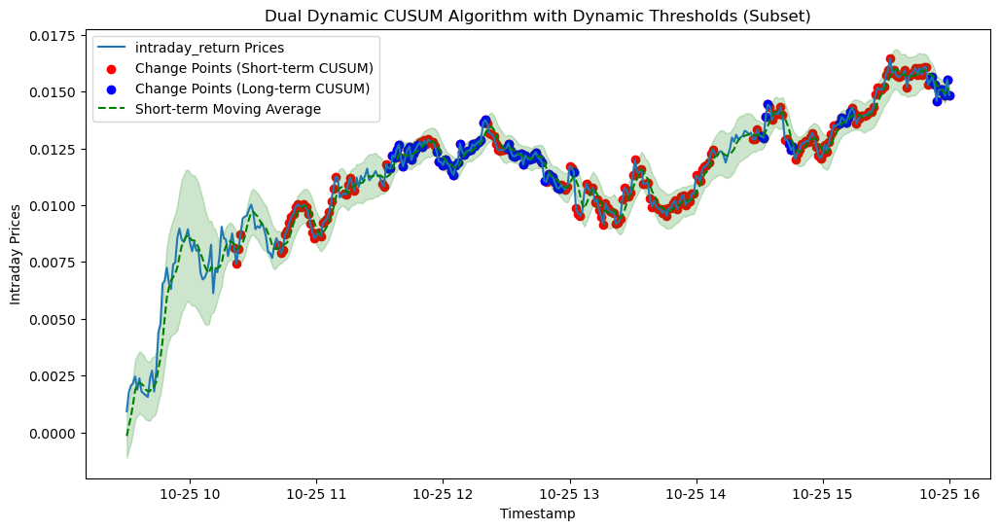

In [340]:
# Plotting the results for the subset
plt.figure(figsize=(12, 6))
plt.plot(intraday_data_subset['intraday_return'], label='intraday_return Prices')
change_points_short_subset = change_points_short_df_subset[change_points_short_df_subset['ChangePoint_CUSUM_Short'] == 1]
change_points_long_subset = change_points_long_df_subset[change_points_long_df_subset['ChangePoint_CUSUM_Long'] == 1]
change_points_short_subset = change_points_short_subset.set_index('Timestamp')  # Set 'Timestamp' as the index
change_points_long_subset = change_points_long_subset.set_index('Timestamp')  # Set 'Timestamp' as the index
plt.scatter(change_points_short_subset.index, intraday_data_subset['intraday_return'].loc[change_points_short_subset.index],
            color='red', label='Change Points (Short-term CUSUM)')
plt.scatter(change_points_long_subset.index, intraday_data_subset['intraday_return'].loc[change_points_long_subset.index],
            color='blue', label='Change Points (Long-term CUSUM)')

# Plot moving averages with +/- std deviations
plt.plot(moving_average_short[start_time:end_time], label='Short-term Moving Average', linestyle='--', color='green')
plt.fill_between(
    moving_average_short[start_time:end_time].index,
    moving_average_short[start_time:end_time] - std_returns_short[start_time:end_time],
    moving_average_short[start_time:end_time] + std_returns_short[start_time:end_time],
    color='green',
    alpha=0.2,
)

plt.title('Dual Dynamic CUSUM Algorithm with Dynamic Thresholds (Subset)')
plt.xlabel('Timestamp')
plt.ylabel('Intraday Prices')
plt.legend()
plt.show()


## Spectral (Fourier) Analaysis

ValueError: x and y must be the same size

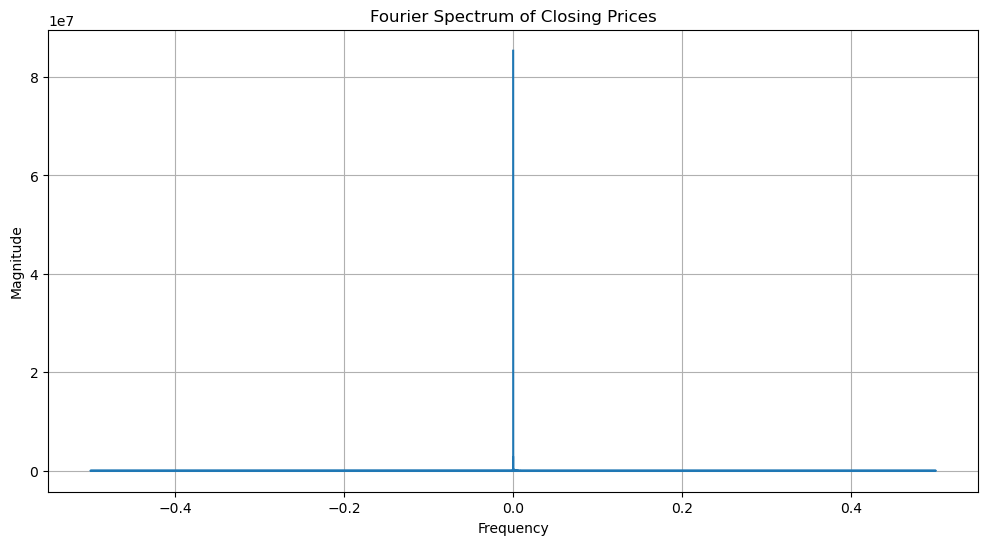

In [62]:
import numpy as np
from scipy.fftpack import fft
import matplotlib.pyplot as plt

# # Assume you have a DataFrame named 'intraday_data' with a column 'close' containing closing prices

# Step 1: Apply Fourier Analysis to closing prices
def apply_fourier_analysis(time_series):
    n = len(time_series)
    yf = fft(np.array(time_series))  # Convert to NumPy array
    xf = np.fft.fftfreq(n, 1)  # Frequency values

    return xf, np.abs(yf)

# Calculate Fourier transform for the closing prices
xf, yf = apply_fourier_analysis(intraday_data['close'])

# Step 2: Identify Dominant Frequencies
def identify_dominant_frequencies(xf, yf, threshold=80):
    # Identify frequencies with magnitude above the threshold
    dominant_frequencies = xf[np.where(yf > threshold)]

    return dominant_frequencies

# Identify dominant frequencies
dominant_frequencies = identify_dominant_frequencies(xf, yf)


# Step 3: Feature Engineering - Create binary variables indicating the presence of dominant frequencies
def create_binary_features(time_series, xf, yf, dominant_frequencies):
    # Convert the index to a numeric representation
    numeric_index = time_series.index.to_numpy().astype(float)

    # Create a DataFrame to store magnitude values for each dominant frequency
    magnitude_df = pd.DataFrame(index=time_series.index)

    # Create a DataFrame to store binary features
    binary_features_df = pd.DataFrame(index=time_series.index)

    # Create binary features and store magnitude values
    for freq in dominant_frequencies:
        # Create a binary variable indicating the presence of the dominant frequency
        binary_features_df[f'freq_{int(freq)}'] = np.cos(2 * np.pi * freq * numeric_index)
        
        # Store magnitude values in the separate DataFrame
        index_freq = np.where(np.isclose(xf, freq, atol=1e-5))[0][0]
        magnitude_df[f'freq_{int(freq)}'] = np.abs(yf[index_freq])

    return binary_features_df, magnitude_df

# Apply Fourier Analysis and create binary features for closing prices
Fourier_binary_features, magnitude_df = create_binary_features(intraday_data['close'], xf, yf, dominant_frequencies)

# Concatenate the binary features DataFrame with the original data
intraday_data_with_binary = pd.concat([intraday_data, Fourier_binary_features], axis=1)

# Visualize the Fourier Spectrum
plt.figure(figsize=(12, 6))

# Plot the Fourier spectrum
plt.plot(xf, yf)
plt.title('Fourier Spectrum of Closing Prices')
plt.xlabel('Frequency')
plt.ylabel('Magnitude')
plt.grid(True)

# Highlight dominant frequencies
plt.scatter(dominant_frequencies, yf[np.where(yf > 0.1)], color='red', label='Dominant Frequencies')

# Display legend
plt.legend()

# Show the plot
plt.show()


In [34]:
intraday_data_with_binary

,open,high,low,close,volume,first_close,intraday_return,Ima_5,Ima_30,Ima_100,...,momentum_kama,others_dr,others_dlr,others_cr,Time_Left,sma_5,sma_30,sma_100,sma_200,freq_0
timestamp,,,,,,,,,,,,,,,,,,,,,
2022-09-30 04:00:00,366.0200,366.1300,366.0200,366.0800,8354,366.08,0.000000,NaN,NaN,NaN,...,366.080000,-10.862714,0.000000,0.000000,901,NaN,NaN,NaN,NaN,0.394189
2022-09-30 04:01:00,366.1100,366.1300,366.0700,366.1300,1100,366.08,0.000137,NaN,NaN,NaN,...,366.102125,0.013658,0.013657,0.013658,900,NaN,NaN,NaN,NaN,0.996212
2022-09-30 04:02:00,365.9800,365.9800,365.8700,365.9100,600,366.08,-0.000464,NaN,NaN,NaN,...,366.017160,-0.060088,-0.060106,-0.046438,899,NaN,NaN,NaN,NaN,0.547454
2022-09-30 04:03:00,365.9800,366.0600,365.8700,366.0600,1800,366.08,-0.000055,NaN,NaN,NaN,...,366.035951,0.040994,0.040985,-0.005463,898,NaN,NaN,NaN,NaN,-0.485591
2022-09-30 04:04:00,366.0700,366.0700,366.0200,366.0200,223,366.08,-0.000164,-0.000109,NaN,NaN,...,366.028942,-0.010927,-0.010928,-0.016390,897,366.04000,NaN,NaN,NaN,-0.999891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-09-29 19:22:00,427.5800,427.5800,427.5500,427.5500,236,430.28,-0.006345,-0.006326,-0.006097,-0.005719,...,427.582008,-0.014031,-0.014032,16.791412,4,427.55800,427.656770,427.656770,427.661021,-0.946079
2023-09-29 19:24:00,427.5201,427.5201,427.5200,427.5200,1319,430.28,-0.006414,-0.006340,-0.006111,-0.005725,...,427.578538,-0.007017,-0.007017,16.783217,3,427.55200,427.650437,427.650437,427.667421,0.793281
2023-09-29 19:39:00,427.6199,427.6199,427.6199,427.6199,1000,430.28,-0.006182,-0.006298,-0.006121,-0.005728,...,427.578920,0.023367,0.023365,16.810506,2,427.56998,427.646433,427.646433,427.673411,-0.988294


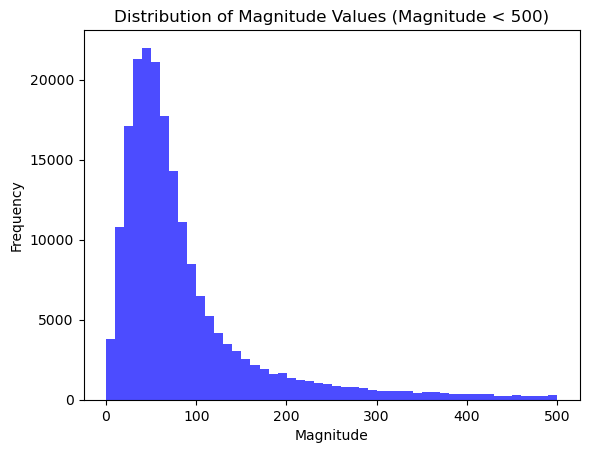

In [63]:

# Assuming yf contains the magnitude values
plt.hist(yf[yf < 500], bins=50, color='blue', alpha=0.7)
plt.title('Distribution of Magnitude Values (Magnitude < 500)')
plt.xlabel('Magnitude')
plt.ylabel('Frequency')
plt.show()

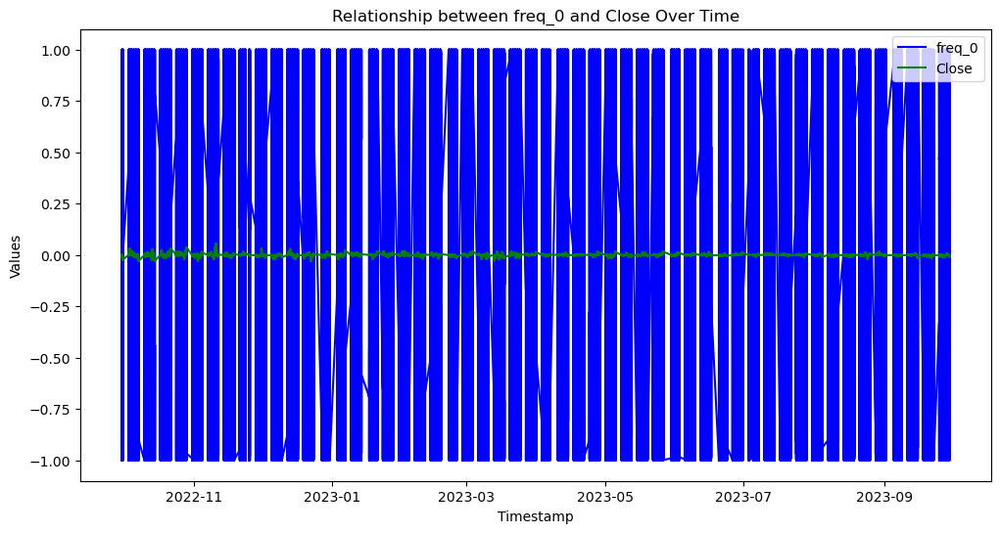

In [37]:

# Extract relevant columns from the DataFrame
timestamps = intraday_data_with_binary.index
freq_0_values = intraday_data_with_binary['freq_0']
close_values = intraday_data_with_binary['intraday_return']

# Plotting
plt.figure(figsize=(12, 6))

# Plot freq_0 values
plt.plot(timestamps, freq_0_values, label='freq_0', color='blue')

# Plot close values
plt.plot(timestamps, close_values, label='Close', color='green')

# Add labels and legend
plt.xlabel('Timestamp')
plt.ylabel('Values')
plt.title('Relationship between freq_0 and Close Over Time')
plt.legend()

# Show the plot
plt.show()

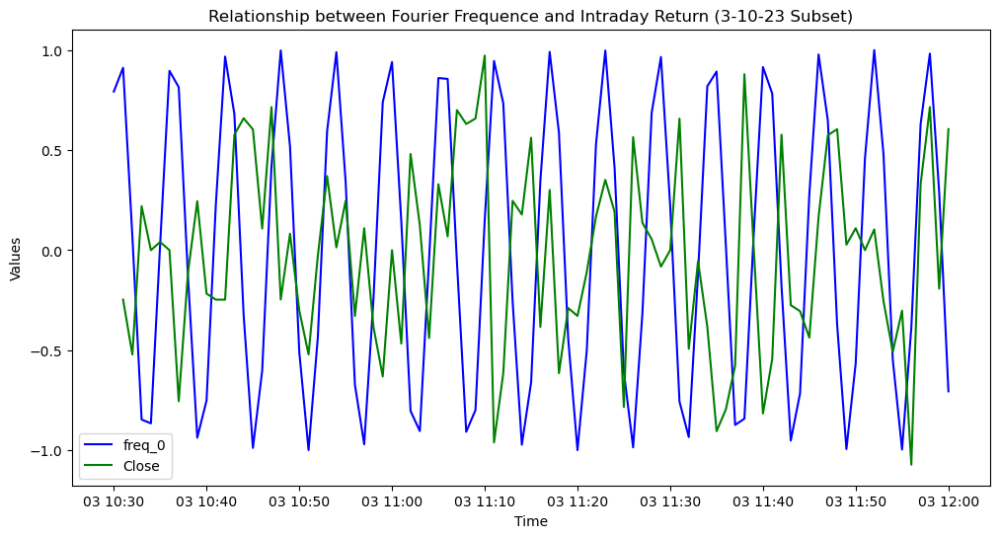

In [66]:
import matplotlib.pyplot as plt

# Set the date range
start_date = '2022-10-03 10:30:00'
end_date = '2022-10-03 12:00:00'

# Filter DataFrame based on date range
subset_data = intraday_data_with_binary.loc[start_date:end_date]

# Extract relevant columns from the DataFrame
timestamps_subset = subset_data.index
freq_0_values_subset = subset_data['freq_0']
close_values_subset = subset_data['intraday_return']
returns = subset_data['close'].pct_change()*1000

# Plotting
plt.figure(figsize=(12, 6))

# Plot freq_0 values
plt.plot(timestamps_subset, freq_0_values_subset, label='freq_0', color='blue')
plt.plot(timestamps_subset, returns, label='Close', color='green')

# Add labels and legend
plt.xlabel('Time')
plt.ylabel('Values')
plt.title('Relationship between Fourier Frequence and Intraday Return (3-10-23 Subset)')
plt.legend()

# Show the plot
plt.show()


In [ ]:
# Print some of the results
print("Dominant Frequencies:")
print(dominant_frequencies)

print("\nCorresponding Magnitudes:")
print(yf[np.where(yf > 0.1)])

# Select a few rows to display the added binary features
rows_to_display = 5  # Adjust as needed
print(f"\nSample of Rows with Binary Features:")
print(Fourier_binary_features.iloc[:rows_to_display, -len(dominant_frequencies):])

In [20]:
# Sample of Rows with Binary Features:
sample_rows = intraday_data.iloc[:rows_to_display].to_frame()
binary_features_columns = sample_rows.columns[-len(dominant_frequencies):]

print(f"\nSample of Rows with Binary Features:")
print(sample_rows[binary_features_columns])


Sample of Rows with Binary Features:
                      close
timestamp                  
2022-09-30 04:00:00  366.08
2022-09-30 04:01:00  366.13
2022-09-30 04:02:00  365.91
2022-09-30 04:03:00  366.06
2022-09-30 04:04:00  366.02


## Bayesian Change Point Detection

/Users/briankregel/opt/anaconda3/lib/python3.8/site-packages/deprecat/classic.py:215: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  return wrapped_(*args_, **kwargs_)
Multiprocess sampling (2 chains in 4 jobs)
CompoundStep
>NUTS: [sigma, beta, alpha]
>Metropolis: [change_point]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 213 seconds.
/Users/briankregel/opt/anaconda3/lib/python3.8/site-packages/arviz/utils.py:187: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)
The acceptance probability does not match the target. It is 0.965199535912558, but should be close to 0.8. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.9363553047435795, but should be close to 0.8. Try to increase the number of tuning steps.
The number of effective samples is smaller than 25% for some parameters.
Got error No model on c

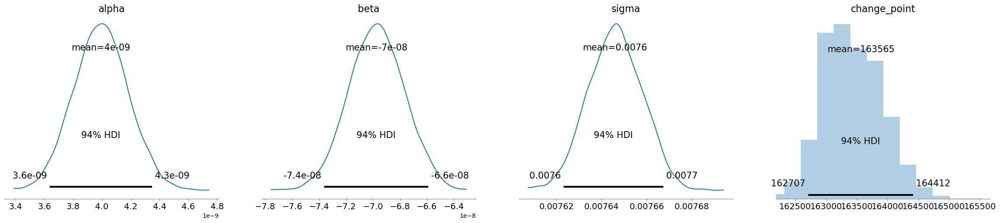

In [8]:
import pandas as pd
import numpy as np
import pymc3 as pm
import matplotlib.pyplot as plt


# Define the returns column for Bayesian Change Point Detection
returns_column = 'intraday_return'

# Function to implement Bayesian Change Point Detection using PyMC3
def bayesian_change_point_detection(data, returns_column):
    with pm.Model() as model:
        # Priors
        alpha = pm.Normal('alpha', mu=0, sd=10)
        beta = pm.Normal('beta', mu=0, sd=10)
        sigma = pm.HalfNormal('sigma', sd=1)

        # Change point
        idx = np.arange(len(data))
        change_point = pm.DiscreteUniform('change_point', lower=0, upper=len(data))

        # Regression model
        regression = pm.math.switch(idx < change_point, alpha * idx, alpha * idx + beta * (idx - change_point))
        likelihood = pm.Normal('likelihood', mu=regression, sd=sigma, observed=data[returns_column])

    with model:
        trace = pm.sample(2000, tune=1000, chains=2)

    return trace

# Run Bayesian Change Point Detection
trace = bayesian_change_point_detection(intraday_data, returns_column)

# Plot the results
pm.plot_posterior(trace, var_names=['alpha', 'beta', 'sigma', 'change_point'])
plt.show()


In [15]:
import pandas as pd
import numpy as np
import pymc3 as pm
import matplotlib.pyplot as plt

# Assuming you have a DataFrame 'intraday_data' with columns 'timestamp', 'closing_price', and 'intraday_return'
# You can resize the data to half
intraday_data_resized = intraday_data.iloc[::2].reset_index(drop=True)

# Define the returns column for Bayesian Change Point Detection
returns_column = 'intraday_return'

# Function to implement Bayesian Change Point Detection with Dirichlet Process Mixture Model
def bayesian_change_point_detection(data, returns_column):
    with pm.Model() as model:
        # Priors
        alpha = pm.Normal('alpha', mu=0, sd=10)
        beta = pm.Normal('beta', mu=0, sd=10)
        sigma = pm.HalfNormal('sigma', sd=1)

        # Mixture model for change points using a finite mixture
        n = len(data)
        K = 30  # Maximum number of change points, you can adjust this
        weights = pm.Dirichlet('weights', np.ones(K))
        change_points = pm.Categorical('change_points', p=weights, shape=n)

        # Sort the change points
        sorted_change_points = pm.Deterministic('sorted_change_points', pm.math.argsort(change_points))

        # Regression model for each segment
        idx = np.arange(len(data))
        for i in range(len(sorted_change_points) + 1):
            start = 0 if i == 0 else sorted_change_points[i - 1]
            end = len(data) if i == len(sorted_change_points) else sorted_change_points[i]
            segment_idx = np.arange(start, end)
            regression = pm.math.switch(idx < end, alpha * idx, alpha * idx + beta * (idx - end))
            likelihood = pm.Normal(f'likelihood_{i}', mu=regression, sd=sigma, observed=data[returns_column][segment_idx])

        # Posterior sampling
        trace = pm.sample(2000, tune=1000, chains=2)

    return trace

# Run Bayesian Change Point Detection
trace = bayesian_change_point_detection(intraday_data_resized, returns_column)

# Plot the results
pm.plot_posterior(trace, var_names=['alpha', 'beta', 'sigma', 'weights', 'change_points'])
plt.show()

# Plot closing price with predicted change points
plt.figure(figsize=(12, 6))
plt.plot(intraday_data_resized['timestamp'], intraday_data_resized['closing_price'], label='Closing Price')
plt.scatter(intraday_data_resized['timestamp'][trace['sorted_change_points'][:, None]], np.repeat(0, trace['sorted_change_points'].shape[0]), color='red', label='Change Points')
plt.xlabel('Time')
plt.ylabel('Closing Price')
plt.title('Closing Price with Predicted Change Points')
plt.legend()
plt.show()


AttributeError: module 'pymc3.math' has no attribute 'argsort'

In [23]:
import pandas as pd
import numpy as np
import pymc3 as pm
import matplotlib.pyplot as plt

# Assuming you have a DataFrame 'intraday_data' with columns 'timestamp', 'closing_price', and 'intraday_return'
# You can resize the data to half
# intraday_data_resized = intraday_data_sorted.head(int(len(intraday_data_sorted) * 0.1)).sort_values(by='timestamp')

# # Sort the data by timestamp in descending order
# intraday_data_sorted = intraday_data.sort_values(by='timestamp', ascending=False)

# # Select the most recent 10% of the data
# intraday_data_resized = intraday_data_sorted.head(int(len(intraday_data_sorted) * 0.1)).sort_values(by='timestamp')

intraday_data_resized = intraday_data.head(int(len(intraday_data) * 0.1)).sort_values(by='timestamp')

# Define the returns column for Bayesian Change Point Detection
returns_column = 'intraday_return'

# Function to implement Bayesian Change Point Detection with Dirichlet Process Mixture Model
def bayesian_change_point_detection(data, returns_column):
    with pm.Model() as model:
        # Priors
        alpha = pm.Normal('alpha', mu=0, sd=10)
        beta = pm.Normal('beta', mu=0, sd=10)
        sigma = pm.HalfNormal('sigma', sd=1)

        # Mixture model for change points using a finite mixture
        n = len(data)
        K = 30  # Maximum number of change points, you can adjust this
        weights = pm.Dirichlet('weights', np.ones(K))
        change_points = pm.Categorical('change_points', p=weights, shape=n)

        # Posterior sampling
        trace = pm.sample(2000, tune=1000, chains=2)

        # Get the mean values of change points
        sorted_change_points_vals = trace['change_points'].mean(axis=0)
        sorted_change_points_vals = np.sort(sorted_change_points_vals)

        # Loop over segments
        idx = np.arange(len(data))
        for i in range(len(sorted_change_points_vals) + 1):
            start = 0 if i == 0 else sorted_change_points_vals[i - 1]
            end = len(data) if i == len(sorted_change_points_vals) else sorted_change_points_vals[i]
            segment_idx = np.arange(int(start), int(end))
            regression = pm.math.switch(idx < end, alpha * idx, alpha * idx + beta * (idx - end))
            likelihood = pm.Normal(f'likelihood_{i}', mu=regression, sd=sigma, observed=data[returns_column][segment_idx])

    return trace

# Run Bayesian Change Point Detection
trace = bayesian_change_point_detection(intraday_data_resized, returns_column)

# Plot the results
pm.plot_posterior(trace, var_names=['alpha', 'beta', 'sigma', 'weights', 'change_points'])
plt.show()

# Plot closing price with predicted change points
plt.figure(figsize=(12, 6))
plt.plot(intraday_data_resized['timestamp'], intraday_data_resized['closing_price'], label='Closing Price')
plt.scatter(intraday_data_resized['timestamp'][trace['change_points'][:, None]], np.repeat(0, trace['change_points'].shape[0]), color='red', label='Change Points')
plt.xlabel('Time')
plt.ylabel('Closing Price')
plt.title('Closing Price with Predicted Change Points')
plt.legend()
plt.show()


/Users/briankregel/opt/anaconda3/lib/python3.8/site-packages/deprecat/classic.py:215: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  return wrapped_(*args_, **kwargs_)
Multiprocess sampling (2 chains in 4 jobs)
CompoundStep
>NUTS: [weights, sigma, beta, alpha]
>CategoricalGibbsMetropolis: [change_points]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 26458 seconds.
There were 94 divergences after tuning. Increase `target_accept` or reparameterize.
There were 1546 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.3026183946756202, but should be close to 0.8. Try to increase the number of tuning steps.
The rhat statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


ValueError: Input dimension mis-match. (input[0].shape[0] = 12, input[1].shape[0] = 20782)

In [24]:
trace

<MultiTrace: 2 chains, 2000 iterations, 5 variables>

In [22]:
intraday_data_resized = intraday_data.head(int(len(intraday_data) * 0.1)).sort_values(by='timestamp')
intraday_data_resized

,open,high,low,close,volume,volume_adi,volume_obv,volume_cmf,volume_fi,volume_em,...,Time_Left,sma_5,sma_30,sma_100,sma_200,first_close,intraday_return,Ima_5,Ima_30,Ima_100
timestamp,,,,,,,,,,,,,,,,,,,,,
2022-09-30 04:00:00,366.0200,366.1300,366.0200,366.080,8354,7.594545e+02,8354,0.090909,0.000000,0.000000,...,901,NaN,NaN,NaN,NaN,366.08,0.000000,NaN,NaN,NaN
2022-09-30 04:01:00,366.1100,366.1300,366.0700,366.130,1100,1.859455e+03,9454,0.196684,55.000000,136.363636,...,900,NaN,NaN,NaN,NaN,366.08,0.000137,NaN,NaN,NaN
2022-09-30 04:02:00,365.9800,365.9800,365.8700,365.910,600,1.695818e+03,8854,0.168671,28.285714,-3208.333333,...,899,NaN,NaN,NaN,NaN,366.08,-0.000464,NaN,NaN,NaN
2022-09-30 04:03:00,365.9800,366.0600,365.8700,366.060,1800,3.495818e+03,10654,0.294906,62.816327,422.222222,...,898,NaN,NaN,NaN,NaN,366.08,-0.000055,NaN,NaN,NaN
2022-09-30 04:04:00,366.0700,366.0700,366.0200,366.020,223,3.272818e+03,10431,0.270996,52.568280,1793.721973,...,897,366.040,NaN,NaN,NaN,366.08,-0.000164,-0.000109,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-02 10:31:00,382.3900,382.4100,382.1900,382.265,51630,3.449169e+07,29419014,0.008402,-942.800543,-21.305443,...,554,382.261,382.513397,382.513397,383.94301,385.12,-0.007413,-0.007424,-0.006768,-0.004852
2022-11-02 10:32:00,382.2700,382.3300,382.1800,382.190,36766,3.445983e+07,29382248,-0.027321,-1202.036180,-18.359354,...,553,382.269,382.495063,382.495063,383.93071,385.12,-0.007608,-0.007403,-0.006816,-0.004902
2022-11-02 10:33:00,382.1800,382.4250,382.1626,382.390,57689,3.450213e+07,29439937,-0.013217,617.940417,17.648287,...,552,382.299,382.481040,382.481040,383.91966,385.12,-0.007089,-0.007325,-0.006852,-0.004942


## Hidden Markov Model

Model is not converging.  Current: 961403.5066777056 is not greater than 961405.4071310977. Delta is -1.9004533921834081


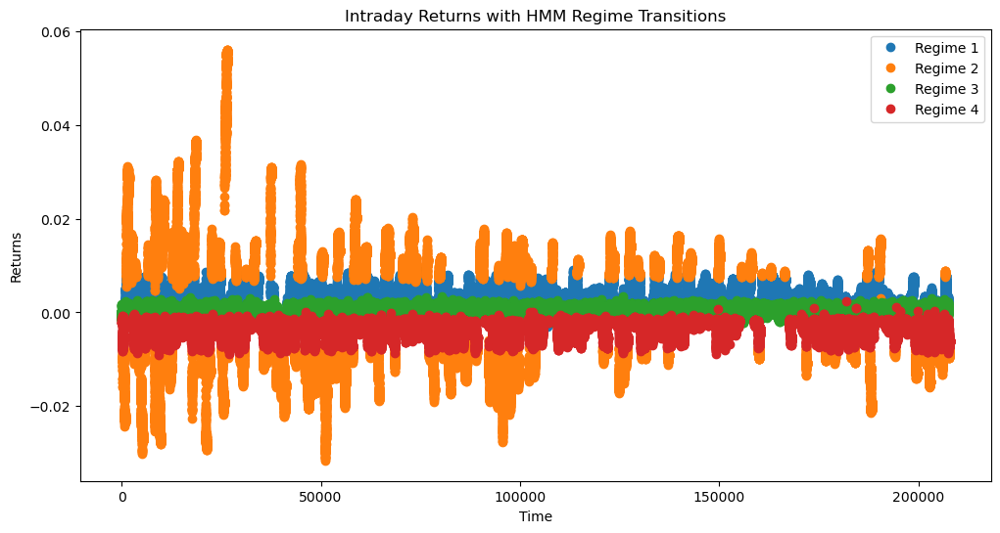

In [40]:
import numpy as np
from hmmlearn import hmm
import matplotlib.pyplot as plt

# Assuming 'intraday_data' is a DataFrame containing the column 'intraday_return'

# Extract intraday returns from the DataFrame
returns = intraday_data['intraday_return'].values.reshape(-1, 1)

# Define the number of hidden states (regimes)
n_states = 4  # Set to the number of clusters identified with k-means

# Create an HMM model
model = hmm.GaussianHMM(n_components=n_states, covariance_type="full", n_iter=3000, random_state=42)

# Fit the model to the data
model.fit(returns)

# Predict the hidden states (regimes)
hidden_states = model.predict(returns)

# Plot the intraday returns with regime transitions
plt.figure(figsize=(12, 6))
for i in range(n_states):
    state_i = (hidden_states == i)
    plt.plot(np.arange(len(returns))[state_i], returns[state_i], 'o', label=f'Regime {i + 1}')

plt.title('Intraday Returns with HMM Regime Transitions')
plt.xlabel('Time')
plt.ylabel('Returns')
plt.legend()
plt.show()


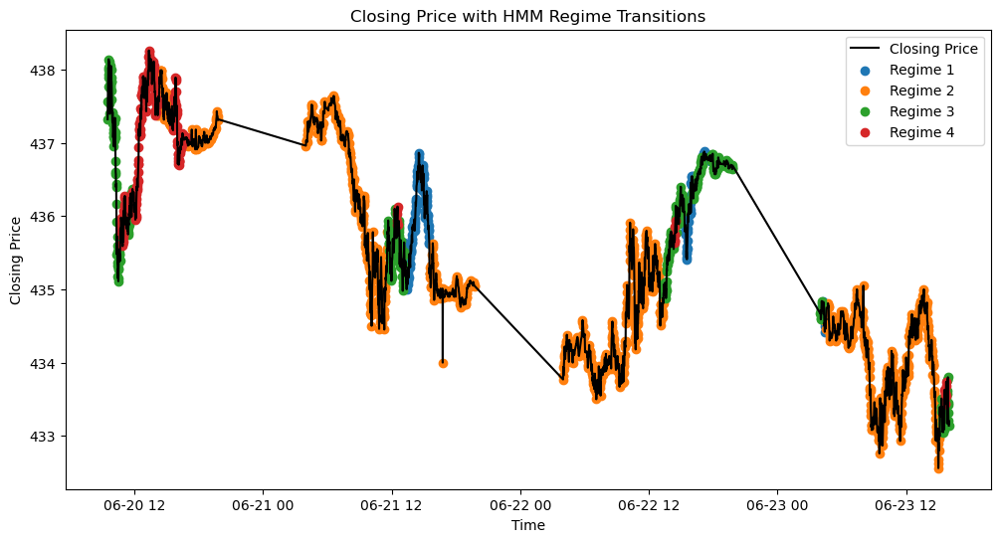

In [42]:
# Filter intraday_data for the specified time range
short = intraday_data['2023-6-20 09:30:00':'2023-6-23 16:00:00']

# Plot the closing price with regime transitions
plt.figure(figsize=(12, 6))

# Plot the closing price using the index
plt.plot(short.index, short['close'], label='Closing Price', color='black')

# Plot regime transitions
for i in range(n_states):
    state_i = (hidden_states[:len(short)] == i)  # Make sure the boolean index matches the length of 'short'
    plt.scatter(short.index[state_i], short['close'][state_i], label=f'Regime {i + 1}')

plt.title('Closing Price with HMM Regime Transitions')
plt.xlabel('Time')
plt.ylabel('Closing Price')
plt.legend()
plt.show()


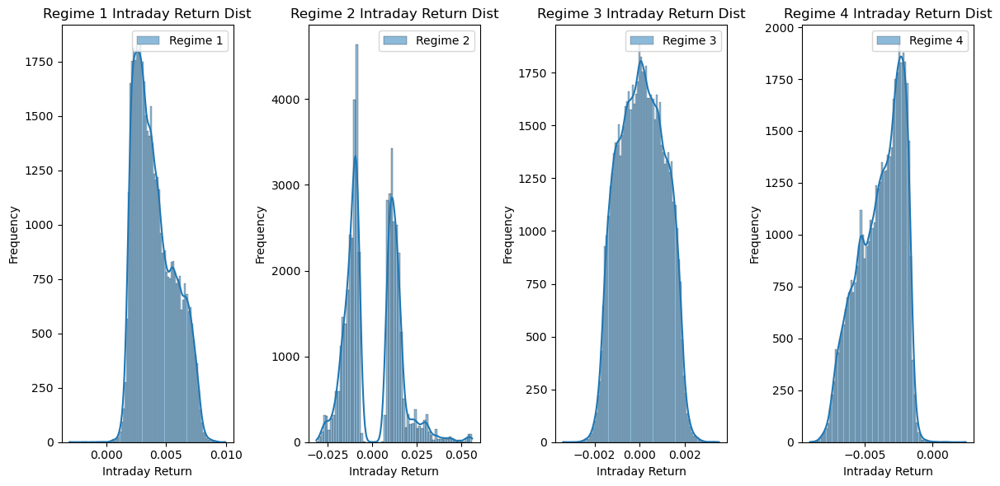

In [59]:
import seaborn as sns

# Combine the states information with intraday_data
intraday_data['Regime'] = hidden_states[:len(intraday_data)]

# Plot histograms for each regime
plt.figure(figsize=(12, 6))
for i in range(n_states):
    plt.subplot(1, n_states, i + 1)
    sns.histplot(intraday_data[intraday_data['Regime'] == i]['intraday_return'], kde=True, label=f'Regime {i + 1}')
    plt.title(f'Regime {i + 1} Intraday Return Dist')
    plt.xlabel('Intraday Return')
    plt.ylabel('Frequency')
    plt.legend()

plt.tight_layout()
plt.show()


In [44]:
# Display summary statistics for each regime
regime_summary_stats = intraday_data.groupby('Regime')['intraday_return'].describe()

# Print the summary statistics
print(regime_summary_stats)

          count      mean       std       min       25%       50%       75%  \
Regime                                                                        
0       46278.0  0.004036  0.001651 -0.003079  0.002677  0.003704  0.005257   
1       46199.0  0.000329  0.015049 -0.031550 -0.011466 -0.007628  0.012026   
2       68268.0  0.000091  0.000980 -0.003393 -0.000686  0.000082  0.000863   
3       47079.0 -0.003844  0.001622 -0.009105 -0.005085 -0.003573 -0.002472   

             max  
Regime            
0       0.009947  
1       0.056056  
2       0.003500  
3       0.002490  


In [45]:
for regime_id, regime_subset in intraday_data.groupby('Regime'):
    print(f"\nRegime {regime_id} Statistics:")
    print("Size:", len(regime_subset))
    print("Mean of Intraday Returns:", np.mean(regime_subset['intraday_return']))
    print("Standard Deviation of Intraday Returns:", np.std(regime_subset['intraday_return']))
    print("Skewness of Intraday Returns:", regime_subset['intraday_return'].skew())
    print("Kurtosis of Intraday Returns:", regime_subset['intraday_return'].kurtosis())


Regime 0 Statistics:
Size: 46278
Mean of Intraday Returns: 0.004035943940466647
Standard Deviation of Intraday Returns: 0.0016507940412182124
Skewness of Intraday Returns: 0.54611623818239
Kurtosis of Intraday Returns: -0.6737322814990376

Regime 1 Statistics:
Size: 46199
Mean of Intraday Returns: 0.00032885221778841163
Standard Deviation of Intraday Returns: 0.015048833233873094
Skewness of Intraday Returns: 0.47006043820639465
Kurtosis of Intraday Returns: -0.2137834787152415

Regime 2 Statistics:
Size: 68268
Mean of Intraday Returns: 9.14992387350784e-05
Standard Deviation of Intraday Returns: 0.0009797084854336142
Skewness of Intraday Returns: 0.019052015335106694
Kurtosis of Intraday Returns: -0.8775569277703887

Regime 3 Statistics:
Size: 47079
Mean of Intraday Returns: -0.003843562042399784
Standard Deviation of Intraday Returns: 0.0016219952366578912
Skewness of Intraday Returns: -0.48201913506813704
Kurtosis of Intraday Returns: -0.7309115242570181


/var/folders/p8/_hr9_yvn54jds8ryw2vz8tkc0000gn/T/ipykernel_37590/3637104345.py:8: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  intraday_data_selected = intraday_data[selected_day]


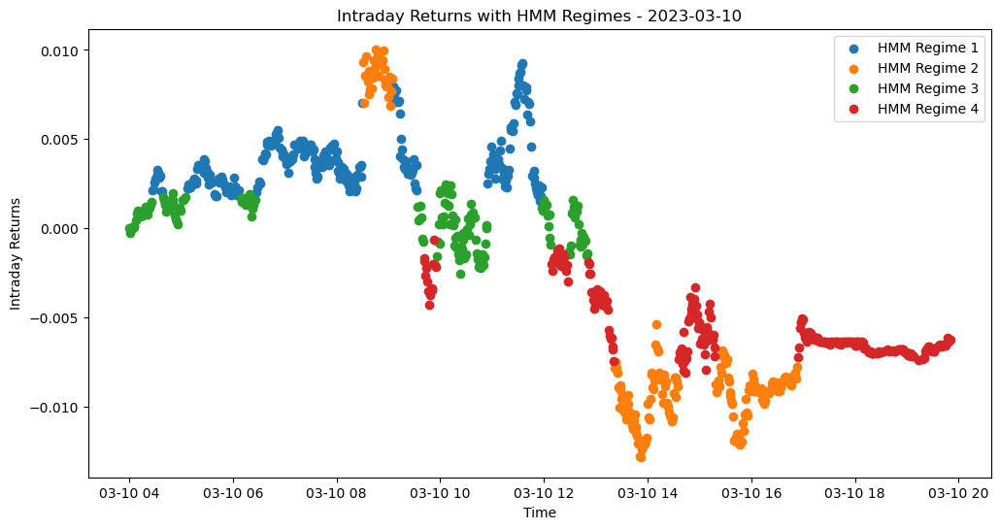

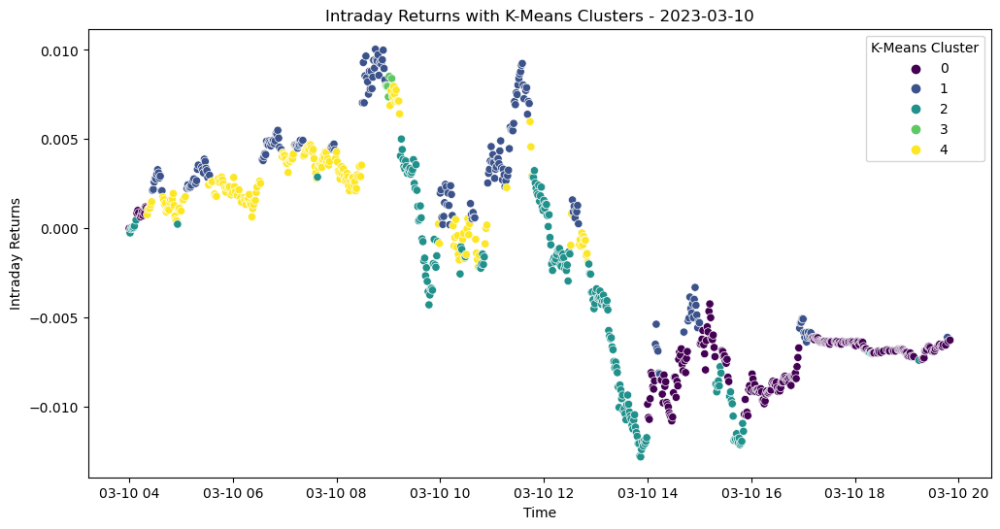

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have 'hidden_states' from HMM and 'cluster_data' from k-means clustering

# Select a specific day (e.g., '2023-03-10')
selected_day = '2023-03-10'
intraday_data_selected = intraday_data[selected_day]
cluster_data_selected = cluster_data[cluster_data.index.date == pd.to_datetime(selected_day).date()]

# Plot the intraday returns colored by HMM regimes
plt.figure(figsize=(12, 6))
for i in range(n_states):
    state_i = (hidden_states == i) & (intraday_data.index.date == pd.to_datetime(selected_day).date())
    plt.scatter(intraday_data.index[state_i], intraday_data['intraday_return'][state_i], label=f'HMM Regime {i + 1}')

plt.title(f'Intraday Returns with HMM Regimes - {selected_day}')
plt.xlabel('Time')
plt.ylabel('Intraday Returns')
plt.legend()
plt.show()

# Plot the intraday returns colored by k-means clusters
plt.figure(figsize=(12, 6))
sns.scatterplot(x=intraday_data_selected.index, y=intraday_data_selected['intraday_return'], hue=cluster_data_selected['Cluster'], palette='viridis', legend='full')
plt.title(f'Intraday Returns with K-Means Clusters - {selected_day}')
plt.xlabel('Time')
plt.ylabel('Intraday Returns')
plt.legend(title='K-Means Cluster')
plt.show()


In [57]:
cluster_data

,intraday_return,trend_macd,trend_macd_diff,trend_macd_signal,momentum_rsi,Ima_5,Ima_30,Ima_100,Cluster,close
timestamp,,,,,,,,,,
2022-09-30 06:02:00,-0.001721,-0.110334,0.022054,-0.132388,51.167537,-0.002426,-0.001902,-0.000829,4,365.4500
2022-09-30 06:03:00,-0.001311,-0.077269,0.044096,-0.121364,54.809561,-0.002202,-0.001911,-0.000842,4,365.6000
2022-09-30 06:04:00,-0.001229,-0.048089,0.058620,-0.106709,55.524015,-0.001825,-0.001915,-0.000855,4,365.6300
2022-09-30 06:05:00,-0.000710,-0.009523,0.077749,-0.087272,59.853108,-0.001475,-0.001907,-0.000858,4,365.8200
2022-09-30 06:06:00,-0.001257,0.004847,0.073695,-0.068848,53.905215,-0.001246,-0.001880,-0.000870,4,365.6200
...,...,...,...,...,...,...,...,...,...,...
2023-09-29 19:22:00,-0.006345,-0.050665,-0.002076,-0.048588,38.152319,-0.006326,-0.006097,-0.005719,0,427.5500
2023-09-29 19:24:00,-0.006414,-0.052494,-0.003125,-0.049369,35.465242,-0.006340,-0.006111,-0.005725,0,427.5200
2023-09-29 19:39:00,-0.006182,-0.045360,0.003208,-0.048568,48.478274,-0.006298,-0.006121,-0.005728,0,427.6199


## Hand Computing Technical Indicators

In [173]:
import pandas as pd

def calculate_rsi(data, window=14):
    # Calculate daily price changes
    delta = data['close'].diff(1)
    
    # Calculate gains and losses
    gains = delta.where(delta > 0, 0)
    losses = -delta.where(delta < 0, 0)
    
    # Calculate average gains and losses over the specified window
    avg_gain = gains.rolling(window=window, min_periods=1).mean()
    avg_loss = losses.rolling(window=window, min_periods=1).mean()
    
    # Calculate the relative strength (RS)
    rs = avg_gain / avg_loss
    
    # Calculate the Relative Strength Index (RSI)
    rsi = 100 - (100 / (1 + rs))
    
    return rsi



def calculate_macd(data, short_window=12, long_window=26, signal_window=9):
    # Calculate short-term and long-term exponential moving averages
    short_ema = data['close'].ewm(span=short_window, adjust=False).mean()
    long_ema = data['close'].ewm(span=long_window, adjust=False).mean()
    
    # Calculate MACD line
    macd_line = short_ema - long_ema
    
    # Calculate signal line
    signal_line = macd_line.ewm(span=signal_window, adjust=False).mean()
    
    # Calculate MACD histogram
    macd_histogram = macd_line - signal_line
    
    return macd_line, signal_line, macd_histogram



def calculate_bollinger_bands(data, window=20, num_std=2):
    # Calculate rolling mean and standard deviation
    rolling_mean = data['close'].rolling(window=window).mean()
    rolling_std = data['close'].rolling(window=window).std()
    
    # Calculate upper and lower Bollinger Bands
    upper_band = rolling_mean + (num_std * rolling_std)
    lower_band = rolling_mean - (num_std * rolling_std)
    
    return upper_band, lower_band



def calculate_stochastic_rsi(data, window=14, stoch_window=14):
    # Calculate RSI
    rsi = calculate_rsi(data, window)
    
    # Calculate the Stochastic RSI
    rsi_min = rsi.rolling(window=stoch_window).min()
    rsi_max = rsi.rolling(window=stoch_window).max()
    
    stochastic_rsi = (rsi - rsi_min) / (rsi_max - rsi_min)
    
    return stochastic_rsi

# Assuming 'intraday_data' is your DataFrame
n = 14  # You can adjust the period (number of days) for which you want to calculate the ATR

# Calculate True Range (TR)
intraday_data['tr'] = intraday_data.apply(
    lambda row: max(row['high'] - row['low'], abs(row['high'] - row['close']), abs(row['close'] - row['low'])),
    axis=1
)

# Calculate Average True Range (ATR)
intraday_data['atr'] = intraday_data['tr'].rolling(window=n).mean()

# Drop 'tr' column if not needed for further analysis
intraday_data = intraday_data.drop(columns=['tr'])

# Assuming you have a DataFrame 'intraday_data'
intraday_data['stochastic_rsi'] = calculate_stochastic_rsi(intraday_data)


# Assuming you have a DataFrame 'intraday_data' with a 'close' column
intraday_data['rsi'] = calculate_rsi(intraday_data)
intraday_data['macd'], intraday_data['macd_signal'], intraday_data['macd_histogram'] = calculate_macd(intraday_data)
intraday_data['upper_band'], intraday_data['lower_band'] = calculate_bollinger_bands(intraday_data)

intraday_data

                       open    high     low   close  volume   volume_adi  \
timestamp                                                                  
2022-09-30 04:00:00  366.02  366.13  366.02  366.08    8354   759.454545   
2022-09-30 04:01:00  366.11  366.13  366.07  366.13    1100  1859.454545   
2022-09-30 04:02:00  365.98  365.98  365.87  365.91     600  1695.818182   
2022-09-30 04:03:00  365.98  366.06  365.87  366.06    1800  3495.818182   
2022-09-30 04:04:00  366.07  366.07  366.02  366.02     223  3272.818182   

                     volume_obv  volume_cmf  volume_fi    volume_em  ...  \
timestamp                                                            ...   
2022-09-30 04:00:00        8354    0.090909   0.000000     0.000000  ...   
2022-09-30 04:01:00        9454    0.196684  55.000000   136.363636  ...   
2022-09-30 04:02:00        8854    0.168671  28.285714 -3208.333333  ...   
2022-09-30 04:03:00       10654    0.294906  62.816327   422.222222  ...   
2022-09-30 

## GARCH Model

In [61]:
import pandas as pd
from arch import arch_model
import seaborn as sns

# 'returns' is financial returns time series
returns = intraday_data['close'].pct_change().dropna()

# Fit GARCH(1, 1) model
model = arch_model(returns, vol='Garch', p=1, q=1)
results = model.fit()

# Forecast future volatility
forecast_volatility = results.conditional_volatility

# Access GARCH model parameters
print(results.summary())



/Users/briankregel/opt/anaconda3/lib/python3.8/site-packages/arch/univariate/base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 1.544e-07. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 1000 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      5,   Neg. LLF: -1365415.6009000223
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -1365415.6001921813
            Iterations: 1
            Function evaluations: 5
            Gradient evaluations: 1


/Users/briankregel/opt/anaconda3/lib/python3.8/site-packages/arch/univariate/base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


                     Constant Mean - GARCH Model Results                      
Dep. Variable:                  close   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:            1.36542e+06
Distribution:                  Normal   AIC:                      -2.73082e+06
Method:            Maximum Likelihood   BIC:                      -2.73078e+06
                                        No. Observations:               207823
Date:                Mon, Dec 04 2023   Df Residuals:                   207822
Time:                        09:30:01   Df Model:                            1
                                  Mean Model                                 
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
mu         8.2467e-07  8.068e-07      1.022      0.307 